# LLM Prompt Importance Heatmapping

## Setup
### Rendering function(s)
### Analysis function(s)

In [207]:
!pip install numpy matplotlib pandas tenacity tqdm openai tiktoken sklearn scipy seaborn torch transformers spacy-alignments

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.8/319.8 kB 5.0 MB/s eta 0:00:005.5 MB/s eta 0:00:01


In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import rgb2hex
import matplotlib
from matplotlib.colors import ListedColormap, rgb2hex
import ipywidgets as widgets
from IPython.display import display, HTML
import re
import pandas as pd
from pprint import pprint
from tenacity import retry
from tqdm import tqdm

In [2]:
def render_heatmap(original_text, importance_scores_df):
    # Extract the importance scores
    importance_values = importance_scores_df['importance_value'].values
    
    # Check for division by zero during normalization
    min_val = np.min(importance_values)
    max_val = np.max(importance_values)
    
    if max_val - min_val != 0:
        normalized_importance_values = (importance_values - min_val) / (max_val - min_val)
    else:
        normalized_importance_values = np.zeros_like(importance_values)  # Fallback: all-zero array

    # Generate a colormap for the heatmap
    cmap = matplotlib.colormaps['inferno']

    # Function to determine text color based on background color
    def get_text_color(bg_color):
        brightness = 0.299 * bg_color[0] + 0.587 * bg_color[1] + 0.114 * bg_color[2]
        if brightness < 0.5:
            return 'white'
        else:
            return 'black'
    
    # Initialize pointers for the original text and token importance
    original_pointer = 0
    token_pointer = 0

    # Create an HTML representation
    html = ""
    while original_pointer < len(original_text):
        token = importance_scores_df.loc[token_pointer, 'token']
        if original_pointer == original_text.find(token, original_pointer):
            importance = normalized_importance_values[token_pointer]
            rgba = cmap(importance)
            bg_color = rgba[:3]
            text_color = get_text_color(bg_color)
            html += f'<span style="background-color: rgba({int(bg_color[0]*255)}, {int(bg_color[1]*255)}, {int(bg_color[2]*255)}, 1); color: {text_color};">{token}</span>'
            original_pointer += len(token)
            token_pointer += 1
        else:
            html += original_text[original_pointer]
            original_pointer += 1

    display(HTML(html))

In [13]:
import openai

## Grab keys from openai_key file
with open('openai_key', 'r') as f:
    lines = f.readlines()
    key_dict = {}
    for line in lines:
        key, value = line.strip().split('=')
        key_dict[key] = value

openai.api_key = key_dict.get('openai_api_key', 'Not found')
openai.organization = key_dict.get('openai_organization', 'Not found')

In [57]:
import tiktoken
def decoded_tokens(string, tokenizer):
    return [tokenizer.decode([x]) for x in tokenizer.encode(string)]

In [17]:
def scale_importance_log(importance_scores, base=None, offset=0.0, min_percentile=0, max_percentile=100, smoothing_constant=1e-10, scaling_factor=1.0, bias=0.0):
    # Extract the importance values
    importance_values = np.array([score[1] for score in importance_scores])

    # Apply optional percentile-based clipping
    if min_percentile > 0 or max_percentile < 100:
        min_val = np.percentile(importance_values, min_percentile)
        max_val = np.percentile(importance_values, max_percentile)
        importance_values = np.clip(importance_values, min_val, max_val)

    # Subtract the minimum value and add the optional offset
    importance_values = importance_values - np.min(importance_values) + offset

    # Add smoothing constant to ensure non-zero values
    importance_values += smoothing_constant

    # Apply logarithmic scaling, with an optional base
    scaled_values = np.log(importance_values) if base is None else np.log(importance_values) / np.log(base)

    # Apply scaling factor and bias
    scaled_values = scaling_factor * scaled_values + bias

    # Normalize to the range [0, 1]
    scaled_values = (scaled_values - np.min(scaled_values)) / (np.max(scaled_values) - np.min(scaled_values))

    # Pair the scaled values with the original tokens
    scaled_importance_scores = [(token, scaled_value) for token, scaled_value in zip([score[0] for score in importance_scores], scaled_values)]

    return scaled_importance_scores

In [19]:
import pandas as pd

def process_importance(importance_function, *args, **kwargs):
    importance_map = importance_function(*args, **kwargs)

    importance_map_df = pd.DataFrame(importance_map, columns=['token', 'importance_value'])

    offset = importance_map_df['importance_value'].mean()

    importance_log = scale_importance_log(
        importance_map, 
        base=None, 
        offset=offset, 
        min_percentile=0, 
        max_percentile=100, 
        scaling_factor=1, 
        bias=0
    )
    importance_log_df = pd.DataFrame(importance_log, columns=['token', 'importance_value'])

    return importance_map_df, importance_log_df


In [84]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats

def analyze_heatmap(df):
    sns.set_palette(sns.color_palette("viridis"))
    
    # Create a copy of the DataFrame to prevent modification of the original
    df_copy = df.copy()
    
    # Ensure DataFrame has the required columns
    if 'token' not in df_copy.columns or 'importance_value' not in df_copy.columns:
        raise ValueError("The DataFrame must contain 'token' and 'importance_value' columns.")
    
    # Add 'Position' column to the DataFrame copy
    df_copy['Position'] = range(len(df_copy))

    # Plot a histogram for distribution of importance scores
    plt.figure(figsize=(10, 4))
    sns.histplot(df_copy['importance_value'], bins=20, kde=True)
    plt.title('Distribution of Importance Scores')
    plt.show()

    # Create a heatmap to show importance over token position
    plt.figure(figsize=(len(df_copy) * 0.3, 4))
    sns.heatmap(df_copy[['importance_value']].T, cmap='viridis', cbar_kws={'label': 'Importance'})
    plt.xticks(ticks=range(len(df_copy)), labels=df_copy['token'], rotation=45, ha='right')
    plt.title('Importance Heatmap')
    plt.show()
    
    # Plot a bar chart for importance score per token
    plt.figure(figsize=(len(df_copy) * 0.3, 4))
    sns.barplot(x='token', y='importance_value', data=df_copy)
    plt.xticks(rotation=45, ha='right')
    plt.title('Importance Score per Token')
    plt.show()

    # Display the top 10 most important words
    top_10_important = df_copy.nlargest(10, 'importance_value')
    print("Top 10 Most Important Words:")
    print(top_10_important[['token', 'importance_value']])

    # Display the top 10 least important words
    top_10_least_important = df_copy.nsmallest(10, 'importance_value')
    print("\nTop 10 Least Important Words:")
    print(top_10_least_important[['token', 'importance_value']])

    # Compute Pearson's correlation coefficient between importance and position
    correlation, p_value = scipy.stats.pearsonr(df_copy['importance_value'], df_copy['Position'])

    # Interpretation
    print(f'\nCorrelation between importance and position in text: {correlation:.2f}')
    print(f'P-value: {p_value:.2f}')

    # Plot the correlation between importance and position in the text
    plt.figure(figsize=(10, 4))
    sns.regplot(x='Position', y='importance_value', data=df_copy, lowess=True)
    plt.title('Correlation between Importance and Position in Text')
    plt.xlabel('Position in Text')
    plt.ylabel('Importance')
    plt.show()

In [280]:
from scipy.stats import pearsonr, kendalltau
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import euclidean
import pandas as pd
import numpy as np

def compare_heatmaps(df1, df2):
    # Ensure the DataFrames have the required columns
    if 'token' not in df1.columns or 'importance_value' not in df1.columns or \
       'token' not in df2.columns or 'importance_value' not in df2.columns:
        raise ValueError("Both DataFrames must contain 'token' and 'importance_value' columns.")
        
    # Replace None with ""
    df1['token'].fillna("", inplace=True)
    df2['token'].fillna("", inplace=True)

    # Extracting importance scores
    importance_scores1 = df1['importance_value'].values
    importance_scores2 = df2['importance_value'].values

    # Check length of both DataFrames
    if len(importance_scores1) != len(importance_scores2):
        raise ValueError("Both DataFrames must have the same length.")
        
    n = len(importance_scores1)  # Number of dimensions (tokens)

    # Calculating Pearson correlation coefficient
    correlation, _ = pearsonr(importance_scores1, importance_scores2)

    # Calculating Cosine similarity
    cos_similarity = cosine_similarity(importance_scores1.reshape(1, -1), importance_scores2.reshape(1, -1))[0][0]

    # Calculating Euclidean distance
    euclid_distance = euclidean(importance_scores1, importance_scores2)
    
    # Calculating Normalized Euclidean distance
    normalized_euclid_distance = euclid_distance / np.sqrt(n)

    # Calculating Kendall's Tau
    tau, _ = kendalltau(importance_scores1, importance_scores2)

    # Creating a dictionary to store the results
    results = {
        'Pearson Correlation': correlation,
        'Cosine Similarity': cos_similarity,
        'Euclidean Distance': normalized_euclid_distance,
        "Kendall's Tau": tau,
    }
    
    # Plotting the importance-by-token across the two heatmaps
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 2, 1)
    plt.bar(df1['token'], importance_scores1, color='b', alpha=0.5, label='DF1')
    plt.title("Importance by Token for DataFrame 1")
    plt.xlabel("Tokens")
    plt.ylabel("Importance Value")
    plt.xticks(rotation=45, ha='right')
    
    plt.subplot(1, 2, 2)
    plt.bar(df2['token'], importance_scores2, color='r', alpha=0.5, label='DF2')
    plt.title("Importance by Token for DataFrame 2")
    plt.xlabel("Tokens")
    plt.ylabel("Importance Value")
    plt.xticks(rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()
    
    return results

In [272]:
import spacy_alignments as tokenizations
import pandas as pd

def align_dataframes(b2a, df1, a2b, df2):
    aligned_strs1 = []
    aligned_vals1 = []
    aligned_strs2 = []
    aligned_vals2 = []
    
    # Keep track of seen indices to avoid duplication
    seen_indices1 = set()
    seen_indices2 = set()
    
    # Align df1 to df2
    for x in b2a:
        aligned_str1 = ""
        aligned_sum1 = 0
        aligned_ct1 = 0
        for y in x:
            if y not in seen_indices1:
                entry = df1.iloc[y]
                aligned_str1 += entry['token']
                aligned_sum1 += entry['importance_value']
                aligned_ct1 += 1
                seen_indices1.add(y)
        
        if aligned_ct1 > 0:
            aligned_strs1.append(aligned_str1)
            aligned_vals1.append(aligned_sum1 / aligned_ct1)
            
    # Align df2 to df1
    for x in a2b:
        aligned_str2 = ""
        aligned_sum2 = 0
        aligned_ct2 = 0
        for y in x:
            if y not in seen_indices2:
                entry = df2.iloc[y]
                aligned_str2 += entry['token']
                aligned_sum2 += entry['importance_value']
                aligned_ct2 += 1
                seen_indices2.add(y)
        
        if aligned_ct2 > 0:
            aligned_strs2.append(aligned_str2)
            aligned_vals2.append(aligned_sum2 / aligned_ct2)
    
    # Create aligned dataframes
    aligned_df1 = pd.DataFrame({'token': aligned_strs1, 'importance_value': aligned_vals1})
    aligned_df2 = pd.DataFrame({'token': aligned_strs2, 'importance_value': aligned_vals2})
    
    # Ensure both dataframes have identical rows and columns
    if len(aligned_df1) < len(aligned_df2):
        padding = len(aligned_df2) - len(aligned_df1)
        aligned_df1 = pd.concat([aligned_df1, pd.DataFrame({'token': [None]*padding, 'importance_value': [0.0]*padding})]).reset_index(drop=True)
    elif len(aligned_df1) > len(aligned_df2):
        padding = len(aligned_df1) - len(aligned_df2)
        aligned_df2 = pd.concat([aligned_df2, pd.DataFrame({'token': [None]*padding, 'importance_value': [0.0]*padding})]).reset_index(drop=True)

    return aligned_df1, aligned_df2

## Ablation study function

In [96]:
from collections import Counter
from math import sqrt

def normalize_vector(v):
    norm = np.linalg.norm(v)
    if norm == 0:
        return v
    return v / norm

def get_embedding(input_text, model=None, tokenizer=None):
    if not model:
        return np.array(openai.Embedding.create(input=input_text, model="text-embedding-ada-002")['data'][0]['embedding'])
    else:
        if not tokenizer:
            raise ValueError("If 'model' is specified, 'tokenizer' must also be specified.")
            
        # Generate input_ids
        input_ids = torch.tensor([tokenizer.encode(input_text)])
    
        # Generate hidden states
        with torch.no_grad():
            outputs = model(input_ids, output_hidden_states=True)
    
        # Select multiple layers (in this case, all of them)
        selected_layers = outputs.hidden_states
    
        # Stack selected layers
        stacked_hidden_states = torch.stack(selected_layers)
    
        # Calculate the mean across layers (result will have same shape as single-layer hidden states)
        mean_hidden_states = torch.mean(stacked_hidden_states, dim=0)[0]
    
        # Count token frequencies
        token_freqs = Counter(tokenizer.encode(input_text))
    
        # Calculate weights as sqrt(inv_freq)
        inv_freqs = {k: 1 / v for k, v in token_freqs.items()}
        weights = [sqrt(inv_freqs[id.item()]) for id in input_ids[0]]
    
        # Normalize weights
        total_weight = sum(weights)
        weights = [weight / total_weight for weight in weights]
    
        # Compute weighted mean of hidden states
        weighted_embedding = sum(weight * hidden_state for weight, hidden_state in zip(weights, mean_hidden_states))
    
        # Convert to numpy array and normalize
        weighted_embedding = weighted_embedding.detach().numpy()
        return normalize_vector(weighted_embedding)
        

In [23]:
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances, manhattan_distances
from scipy.stats import pearsonr, kendalltau

@retry
def approximate_importance(perturbed_text, original_embedding, end_to_end, weights={
    "cosine": 0.5,
    "euclidean": 0.0,
    "manhattan": 0.5,
    "pearson": 0.0,
    "kendall": 0.0,
}):
    system_message = {"role": "system", "content": "You are a helpful assistant"}
    if end_to_end:
        messages = [
            system_message,
            {"role": "user", "content": perturbed_text}
        ]
        # Generate text based on the perturbed input using gpt-3.5-turbo
        perturbed_output = openai.ChatCompletion.create(model="gpt-3.5-turbo", messages=messages, temperature=0)['choices'][0]['message']['content']
        
        # Get the embedding for the generated text
        perturbed_embedding = np.array(openai.Embedding.create(input=perturbed_output, model="text-embedding-ada-002")["data"][0]["embedding"])
        
    else:
        # Get the embedding for the text
        perturbed_embedding = np.array(openai.Embedding.create(input=perturbed_text, model="text-embedding-ada-002")["data"][0]["embedding"])
        
    # Compute "importance" measures
    cosine_dist = 1 - cosine_similarity(original_embedding.reshape(1, -1), perturbed_embedding.reshape(1, -1))[0][0]
    euclidean_dist = euclidean_distances(original_embedding.reshape(1, -1), perturbed_embedding.reshape(1, -1))[0][0]
    manhattan_dist = manhattan_distances(original_embedding.reshape(1, -1), perturbed_embedding.reshape(1, -1))[0][0]
    pearson_dist = 1 - pearsonr(original_embedding, perturbed_embedding)[0]
    kendall_dist = 1 - kendalltau(original_embedding, perturbed_embedding)[0]
    
    # Normalize the distances (the closer to 1, the more similar)
    euclidean_imp = 1 - (1 / (1 + euclidean_dist))
    manhattan_imp = 1 - (1 / (1 + manhattan_dist))

    # Calculate the weighted sum of the importance measures
    combined_importance = (
        weights["cosine"] * cosine_dist +
        weights["euclidean"] * euclidean_imp +
        weights["manhattan"] * manhattan_imp +
        weights["pearson"] * pearson_dist +
        weights["kendall"] * kendall_dist
    )

    return combined_importance

In [25]:
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances, manhattan_distances
from scipy.stats import pearsonr, kendalltau

def local_approximate_importance(perturbed_text, original_embedding, model, tokenizer, weights={
    "cosine": 1.0,
    "euclidean": 0.0,
    "manhattan": 0.0,
    "pearson": 0.0,
    "kendall": 0.0,
}):
    # Get the embedding for the text
    perturbed_embedding = weighted_mean_embedding(perturbed_text, model, tokenizer)
        
    # Compute "importance" measures
    cosine_dist = 1 - cosine_similarity(original_embedding.reshape(1, -1), perturbed_embedding.reshape(1, -1))[0][0]
    euclidean_dist = euclidean_distances(original_embedding.reshape(1, -1), perturbed_embedding.reshape(1, -1))[0][0]
    manhattan_dist = manhattan_distances(original_embedding.reshape(1, -1), perturbed_embedding.reshape(1, -1))[0][0]
    pearson_dist = 1 - pearsonr(original_embedding, perturbed_embedding)[0]
    kendall_dist = 1 - kendalltau(original_embedding, perturbed_embedding)[0]
    
    # Normalize the distances (the closer to 1, the more similar)
    euclidean_imp = 1 - (1 / (1 + euclidean_dist))
    manhattan_imp = 1 - (1 / (1 + manhattan_dist))

    # Calculate the weighted sum of the importance measures
    combined_importance = (
        weights["cosine"] * cosine_dist +
        weights["euclidean"] * euclidean_imp +
        weights["manhattan"] * manhattan_imp +
        weights["pearson"] * pearson_dist +
        weights["kendall"] * kendall_dist
    )

    return combined_importance

In [36]:
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances, manhattan_distances
from scipy.stats import pearsonr, kendalltau

@retry
def approximate_importance(perturbed_text, original_embedding, model=None, tokenizer=None):
    perturbed_embedding = get_embedding(perturbed_text, model, tokenizer)
        
    # Compute "importance" measures
    cosine_dist = 1 - cosine_similarity(original_embedding.reshape(1, -1), perturbed_embedding.reshape(1, -1))[0][0]
    
    return cosine_dist

In [62]:
def ablated_relative_importance(input_text, tokenizer, model=None,):
    original_embedding = get_embedding(input_text, model, tokenizer)
    tokens = decoded_tokens(input_text, tokenizer)
    importance_scores = []
    
    with tqdm(total=len(tokens), desc="Calculating Token Importances", position=0, leave=True) as progress:
        for i in range(len(tokens)):
            perturbed_text = "".join(tokens[:i] + tokens[i+1:])
            importance = approximate_importance(perturbed_text, original_embedding, model, tokenizer)
            importance_scores.append((tokens[i], importance))
            progress.update(1)
            
    return importance_scores

In [42]:
def integrated_gradients(input_ids, baseline, model, n_steps=100):
    # Convert input_ids and baseline to LongTensors
    input_ids = input_ids.long()
    baseline = baseline.long()

    # Initialize tensor to store accumulated gradients
    accumulated_grads = None
    
    # Create interpolated inputs
    alphas = torch.linspace(0, 1, n_steps)
    delta = input_ids - baseline
    interpolates = [(baseline + (alpha * delta).long()).long() for alpha in alphas]  # Explicitly cast to LongTensor
    
    # Initialize tqdm progress bar
    pbar = tqdm(total=n_steps, desc="Calculating Integrated Gradients")
    
    for interpolate in interpolates:
        
        # Update tqdm progress bar
        pbar.update(1)
        
        # Convert interpolated samples to embeddings
        interpolate_embedding = model.transformer.wte(interpolate).clone().detach().requires_grad_(True)

        # Forward pass
        output = model(inputs_embeds=interpolate_embedding, output_attentions=False)[0]
        
        # Aggregate the logits across all positions (using sum in this example)
        aggregated_logit = output.sum() 
        
        # Backward pass to calculate gradients
        aggregated_logit.backward()

        # Accumulate gradients
        if accumulated_grads is None:
            accumulated_grads = interpolate_embedding.grad.clone()
        else:
            accumulated_grads += interpolate_embedding.grad
        
        # Clear gradients
        model.zero_grad()
        interpolate_embedding.grad.zero_()

    # Close tqdm progress bar
    pbar.close()
    
    # Compute average gradients
    avg_grads = accumulated_grads / n_steps

    # Compute attributions
    with torch.no_grad():
        input_embedding = model.transformer.wte(input_ids)
        baseline_embedding = model.transformer.wte(baseline)
        attributions = (input_embedding - baseline_embedding) * avg_grads
    
    return attributions

In [55]:
def process_integrated_gradients(input_text, gpt2tokenizer, model):
    inputs = torch.tensor([gpt2tokenizer.encode(input_text)])
    
    gpt2tokens = decoded_tokens(input_text, gpt2tokenizer)

    with torch.no_grad():
        outputs = model(inputs, output_attentions=True, output_hidden_states=True)

    attentions = outputs[-1]

    # Initialize a baseline as zero tensor
    baseline = torch.zeros_like(inputs).long()

    # Compute Integrated Gradients targeting the aggregated sequence output
    attributions = integrated_gradients(inputs, baseline, model)

    # Convert tensors to numpy array for easier manipulation
    attributions_np = attributions.detach().numpy().sum(axis=2)

    # Sum across the embedding dimensions to get a single attribution score per token
    attributions_sum = attributions.sum(axis=2).squeeze(0).detach().numpy()

    l2_norm_attributions = np.linalg.norm(attributions_sum, 2)
    normalized_attributions_sum = attributions_sum / l2_norm_attributions

    clamped_attributions_sum = np.where(normalized_attributions_sum < 0, 0, normalized_attributions_sum)
    
    attribution_df = pd.DataFrame({
    'token': gpt2tokens,
    'importance_value': clamped_attributions_sum
    })
    return attribution_df


## Experiment Set up

In [40]:
import torch
from transformers import GPT2LMHeadModel
import tiktoken

In [41]:
model_type = 'gpt2'
model_version = 'gpt2'
model = GPT2LMHeadModel.from_pretrained(model_version, output_attentions=True)
gpt2tokenizer = tiktoken.get_encoding("gpt2")

In [296]:
# Prompt set up
prompt1 = """Label the entire span of the company descriptions with key “HealthTech” and a value 1 through 5 where 1 is a company that has limited to no applications in the healthcare space and 5 is one that is completely dedicated to healthcare. An example of a 5 is "Lucem Health develops a remote diagnostics platform designed to connect remote patient telemetry and biosensing devices with AI algorithms. Lucem's platform focuses on data ingest, orchestration, and connectivity, enabling clinicians to provide more effective continuous care and empower consumers to have better control of their health and well-being.” and example of a 1 is “Nzero is a 24/7 carbon emissions tracking management platform that captures Scope 1, 2, and 3 emissions data with accuracy. Leveraging customers’ energy, water, and utility data, plus publicly-reported emissions and partner data, their platform provides accurate, actionable, and auditable insights that empower customers to take tangible steps to lower their carbon impact and reach net zero. The company was founded in 2017 and is headquartered in Carson City, Nevada.” Return the entire span of the cell in the format {’span’: ‘ENTIRECONTENTSOFCELL’, ‘Healthtech’: ‘1-5’}. The only values for key “Healthtech” are “1” “2” “3” “4” “5”
"""

prompt2 = """Label the entire cell with key "Dev_tools" and value "True" if the company that is described builds developer tools. Developer tools are Software that assists in the creation of new software. Compilers, debuggers, visual programming tools, GUI builders, application generators are examples.
"""

prompt3 = """Read all of the instructions below and once you understand them say "Shall we begin:"
 
I want you to become my Prompt Creator. Your goal is to help me craft the best possible prompt for my needs. The prompt will be used by you, ChatGPT. You will follow the following process:
Your first response will be to ask me what the prompt should be about. I will provide my answer, but we will need to improve it through continual iterations by going through the next steps.
 
Based on my input, you will generate 3 sections.
 
Revised Prompt (provide your rewritten prompt. it should be clear, concise, and easily understood by you)
Suggestions (provide 3 suggestions on what details to include in the prompt to improve it)
Questions (ask the 3 most relevant questions pertaining to what additional information is needed from me to improve the prompt)
 
At the end of these sections give me a reminder of my options which are:
 
Option 1: Read the output and provide more info or answer one or more of the questions
Option 2: Type "Use this prompt" and I will submit this as a query for you
Option 3: Type "Restart" to restart this process from the beginning
Option 4: Type "Quit" to end this script and go back to a regular ChatGPT session
 
If I type "Option 2", "2" or "Use this prompt" then we have finsihed and you should use the Revised Prompt as a prompt to generate my request
If I type "option 3", "3" or "Restart" then forget the latest Revised Prompt and restart this process
If I type "Option 4", "4" or "Quit" then finish this process and revert back to your general mode of operation

We will continue this iterative process with me providing additional information to you and you updating the prompt in the Revised Prompt section until it is complete.
"""

prompt4 = """Begin your prompt by clearly outlining the task at hand. Request the generation of three innovative startup ideas that operate within the enterprise B2B SaaS industry. These ideas should incorporate Artificial Intelligence in a significant way to enhance their value proposition.

To ensure the ideas are compelling and investment-worthy, provide a robust mission statement for each startup that clearly articulates its purpose, value, and long-term vision. Keep in mind that the ideas should be captivating enough to attract potential investors to invest a substantial amount of money.

Avoid suggesting ideas that revolve around cryptocurrency or blockchain technology. Instead, focus on other promising areas within the B2B SaaS and AI sector.

In addition to the startup ideas and mission statements, request that each idea be accompanied by a unique and intriguing name that aligns with the startup's mission and would appeal to the target market.

Ensure that each startup idea is presented in a structured format for clarity. For instance, each idea could be structured as follows:

Startup Name
Mission Statement
Description of the AI application
Why it's compelling for investors
Steer clear from any ambiguous or unclear language. Be sure to use specific, detailed, and precise language throughout the prompt.

For example, instead of saying "The startup ideas should have a cool and interesting name", you could say "Each startup idea should include a unique, catchy, and marketable name that aligns with the startup's mission and target market."

Remember, the goal is to generate startup ideas that are not only innovative but also have a clear path to profitability and growth, thereby making them attractive to investors.
"""

prompt5 = """I want you to act as a machine learning engineer. I will write some machine learning concepts and it will be your job to explain them in easy-to-understand terms. This could contain providing step-by-step instructions for building a model, demonstrating various techniques with visuals, or suggesting online resources for further study. My first suggestion request is "I have a dataset without labels. Which machine learning algorithm should I use?"
"""

## GPT-2 Embedding vs. GPT-2 Integrated Gradients

In [69]:
# Prompt 1
%time attribution_df1 = process_integrated_gradients(prompt1, gpt2tokenizer, model)
%time importance_map_df1, importance_map_log_df1 = process_importance(ablated_relative_importance, prompt1, gpt2tokenizer, model)

Calculating Integrated Gradients: 100%|█████████████████████████████████████████████| 100/100 [02:26<00:00,  1.47s/it]


CPU times: user 16min 28s, sys: 3min 30s, total: 19min 58s
Wall time: 2min 27s


Calculating Token Importances: 100%|████████████████████████████████████████████████| 305/305 [02:49<00:00,  1.80it/s]

CPU times: user 21min 44s, sys: 2min 20s, total: 24min 4s
Wall time: 2min 49s


-----Integrated Gradients Attributions-----


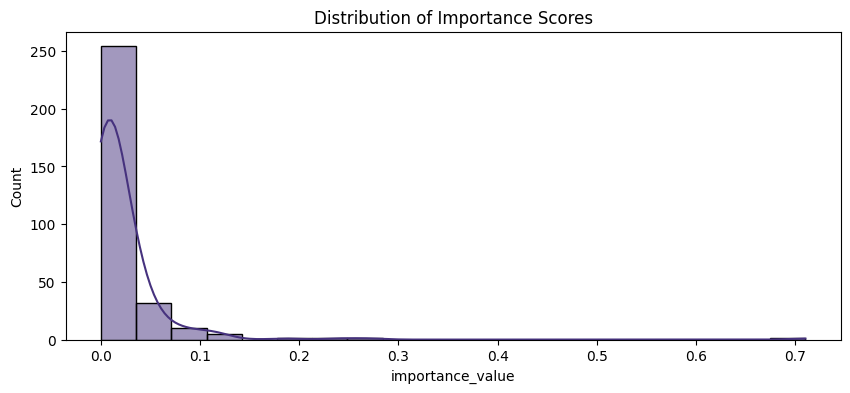

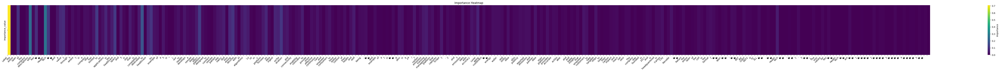

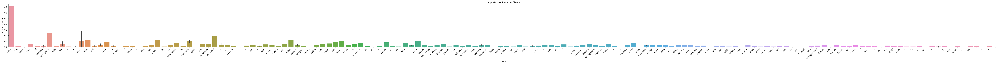

Top 10 Most Important Words:
            token  importance_value
0           Label          0.710328
12         Health          0.269872
7    descriptions          0.240725
44      dedicated          0.185751
63         ostics          0.124504
29        limited          0.118536
35     healthcare          0.118189
13           Tech          0.111698
90          orche          0.108430
47              .          0.105833

Top 10 Least Important Words:
       token  importance_value
1        the               0.0
2     entire               0.0
4         of               0.0
5        the               0.0
10         �               0.0
11         �               0.0
14         �               0.0
15         �               0.0
20   through               0.0
24        is               0.0

Correlation between importance and position in text: -0.34
P-value: 0.00


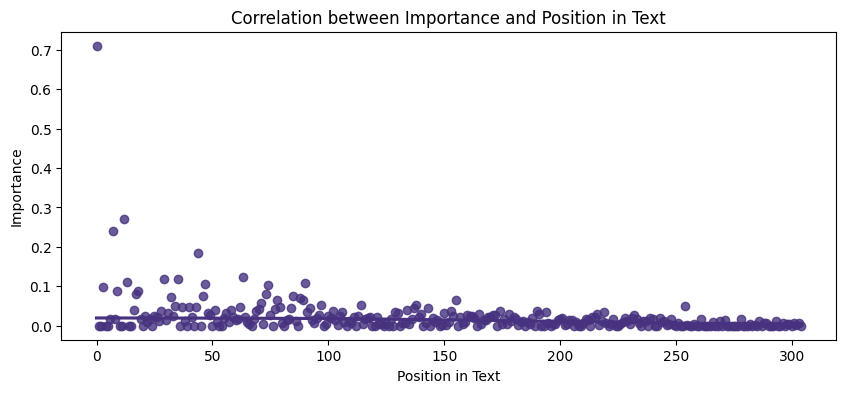

-----GPT-2 Embedded Ablated Log Scaled-----


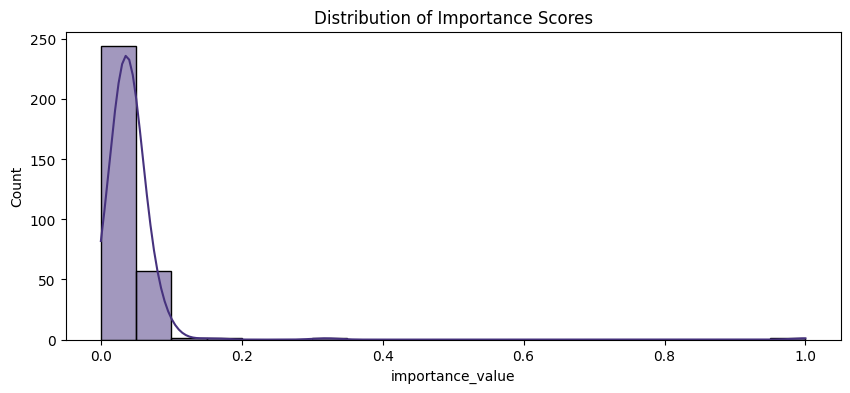

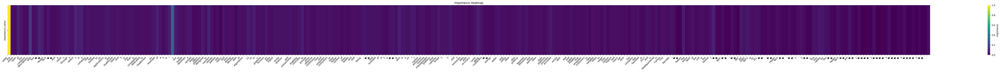

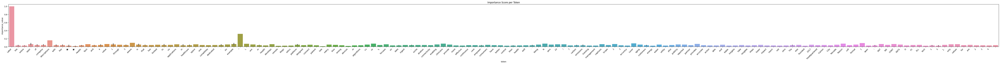

Top 10 Most Important Words:
             token  importance_value
0            Label          1.000000
54               "          0.319119
7     descriptions          0.156748
10               �          0.100969
22           where          0.096285
233              {          0.090738
66              to          0.089153
3             span          0.086721
49         example          0.086623
53              is          0.084283

Top 10 Least Important Words:
    token  importance_value
287     �          0.000000
288     �          0.000000
282     �          0.000425
283     �          0.000425
292     �          0.004732
293     �          0.004732
285     �          0.005788
297     �          0.005788
298     �          0.005788
300     �          0.005999

Correlation between importance and position in text: -0.28
P-value: 0.00


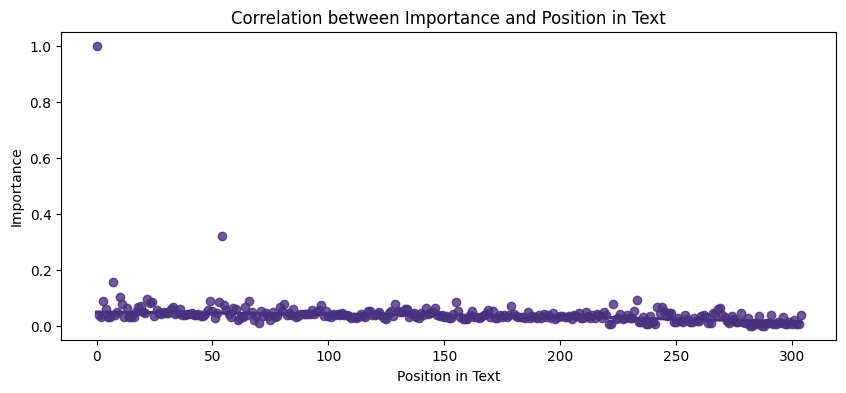




-----GPT-2 Embedded Log Scaled vs. Integrated Gradients-----


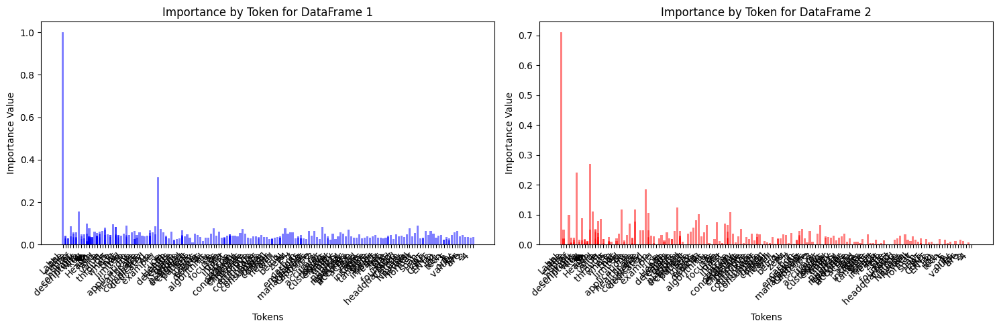

{'Pearson Correlation': 0.7658331092707213, 'Cosine Similarity': 0.8056371635616976, 'Euclidean Distance': 0.04383822819522034, "Kendall's Tau": 0.24393651747898465}


In [117]:
# Prompt 1 Result Analysis
print("-----Integrated Gradients Attributions-----")
analyze_heatmap(attribution_df1)
print("-----GPT-2 Embedded Ablated Log Scaled-----")
analyze_heatmap(importance_map_log_df1)

print("\n\n")

print("-----GPT-2 Embedded Log Scaled vs. Integrated Gradients-----")
print(compare_heatmaps(importance_map_log_df1, attribution_df1))

In [71]:
# Prompt 2
%time attribution_df2 = process_integrated_gradients(prompt2, gpt2tokenizer, model)
%time importance_map_df2, importance_map_log_df2 = process_importance(ablated_relative_importance, prompt2, gpt2tokenizer, model)

Calculating Integrated Gradients: 100%|█████████████████████████████████████████████| 100/100 [00:49<00:00,  2.03it/s]


CPU times: user 5min 48s, sys: 1min 3s, total: 6min 52s
Wall time: 49.4 s


Calculating Token Importances: 100%|██████████████████████████████████████████████████| 58/58 [00:09<00:00,  6.25it/s]

CPU times: user 1min 2s, sys: 14.4 s, total: 1min 16s
Wall time: 9.45 s


-----Integrated Gradients Attributions-----


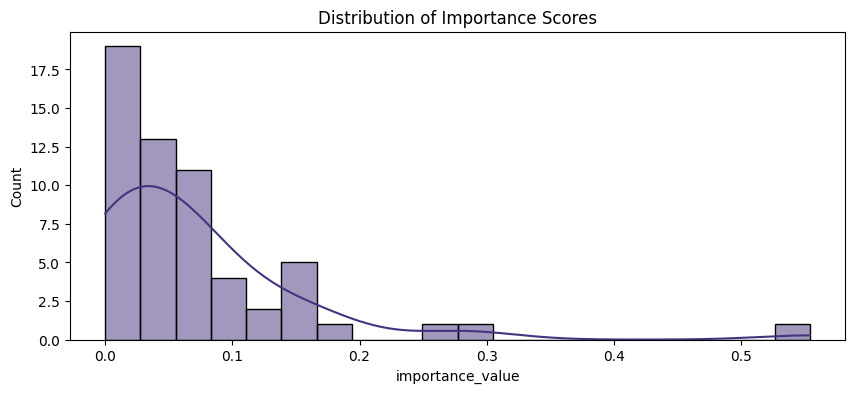

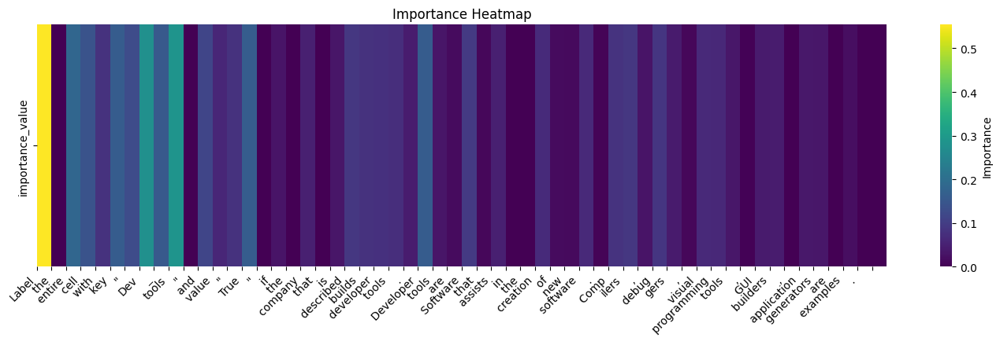

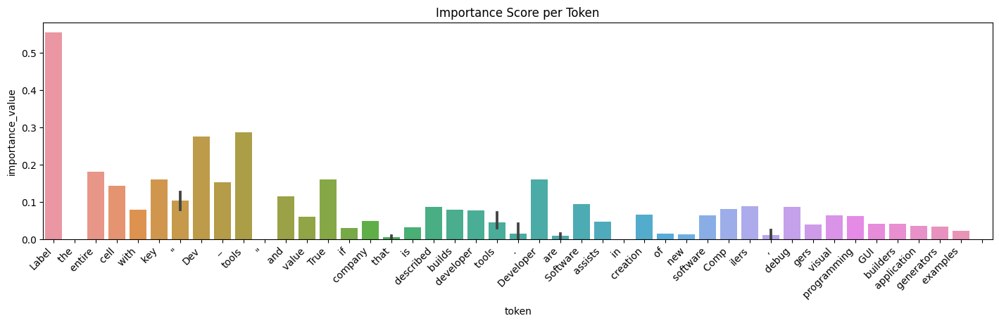

Top 10 Most Important Words:
         token  importance_value
0        Label          0.554155
9        tools          0.287086
7          Dev          0.275970
2       entire          0.180749
14        True          0.160856
26   Developer          0.159776
5          key          0.159592
8            _          0.153106
3         cell          0.142829
6            "          0.126864

Top 10 Least Important Words:
    token  importance_value
1     the               0.0
10      "               0.0
15      "               0.0
17    the               0.0
19   that               0.0
32     in               0.0
33    the               0.0
51      ,               0.0
56      .               0.0
57     \n               0.0

Correlation between importance and position in text: -0.52
P-value: 0.00


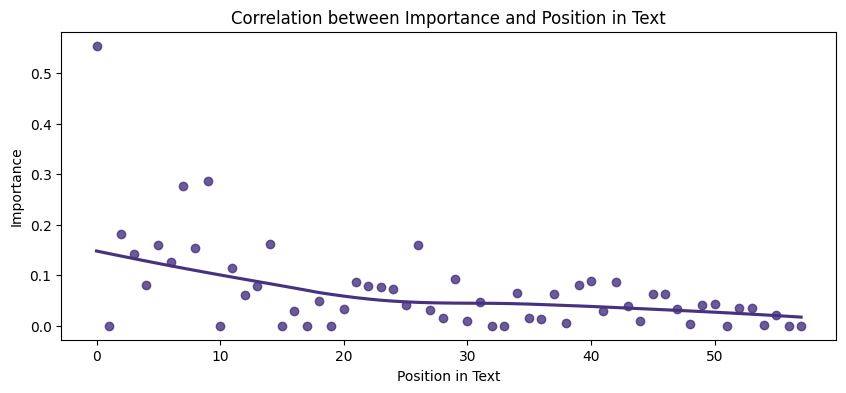

-----GPT-2 Embedded Ablated Log Scaled-----


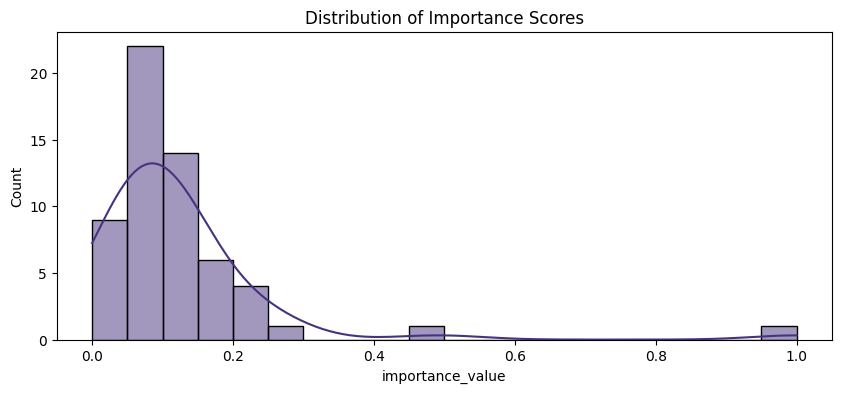

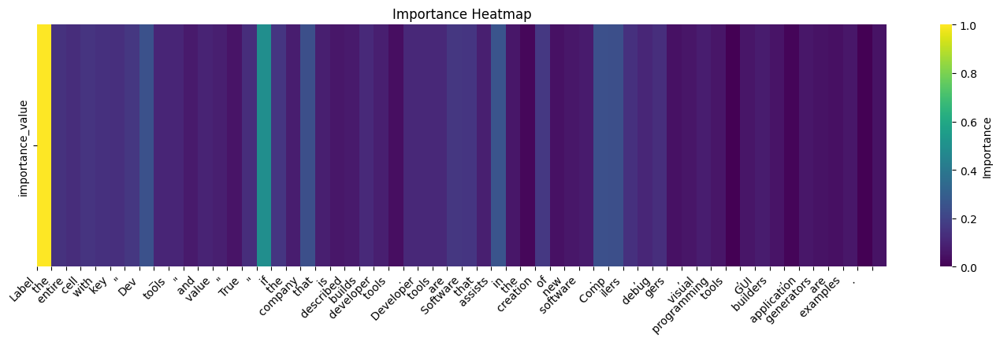

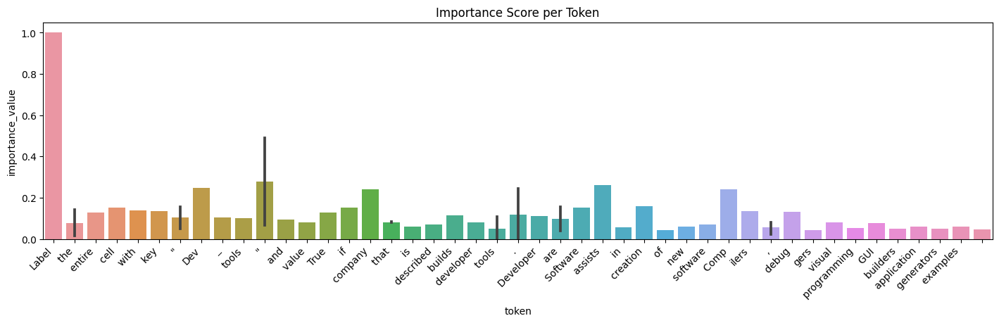

Top 10 Most Important Words:
        token  importance_value
0       Label          1.000000
15          "          0.491574
31    assists          0.260736
7         Dev          0.249495
38          .          0.243700
18    company          0.240966
39       Comp          0.239920
34   creation          0.160383
6           "          0.157208
28        are          0.156699

Top 10 Least Important Words:
          token  importance_value
56            .          0.000000
47        tools          0.000061
51            ,          0.013401
33          the          0.015906
24        tools          0.037618
54          are          0.039233
35           of          0.043605
43         gers          0.044819
57           \n          0.048018
53   generators          0.050562

Correlation between importance and position in text: -0.40
P-value: 0.00


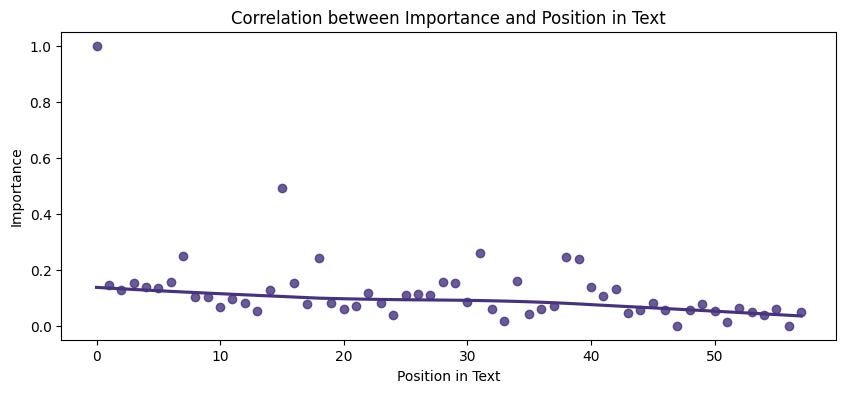




-----GPT-2 Embedded Log Scaled vs. Integrated Gradients-----


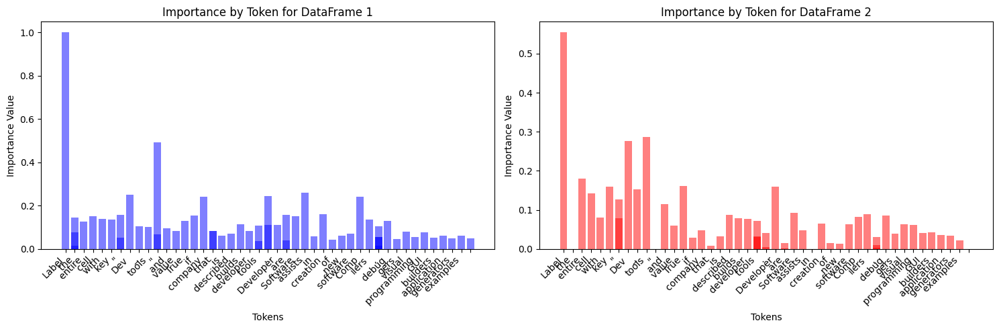

{'Pearson Correlation': 0.671656940611606, 'Cosine Similarity': 0.8015851238908918, 'Euclidean Distance': 0.11691172769538773, "Kendall's Tau": 0.3184339134016559}


In [118]:
# Prompt 2 Result Analysis
print("-----Integrated Gradients Attributions-----")
analyze_heatmap(attribution_df2)
print("-----GPT-2 Embedded Ablated Log Scaled-----")
analyze_heatmap(importance_map_log_df2)

print("\n\n")

print("-----GPT-2 Embedded Log Scaled vs. Integrated Gradients-----")
print(compare_heatmaps(importance_map_log_df2, attribution_df2))

In [88]:
# Prompt 3
%time attribution_df3 = process_integrated_gradients(prompt3, gpt2tokenizer, model)
%time importance_map_df3, importance_map_log_df3 = process_importance(ablated_relative_importance, prompt3, gpt2tokenizer, model)

Calculating Integrated Gradients: 100%|█████████████████████████████████████████████| 100/100 [03:22<00:00,  2.02s/it]


CPU times: user 24min 39s, sys: 2min 59s, total: 27min 39s
Wall time: 3min 22s


Calculating Token Importances: 100%|████████████████████████████████████████████████| 411/411 [05:22<00:00,  1.27it/s]

CPU times: user 30min 32s, sys: 7min 59s, total: 38min 31s
Wall time: 5min 23s


-----Integrated Gradients Attributions-----


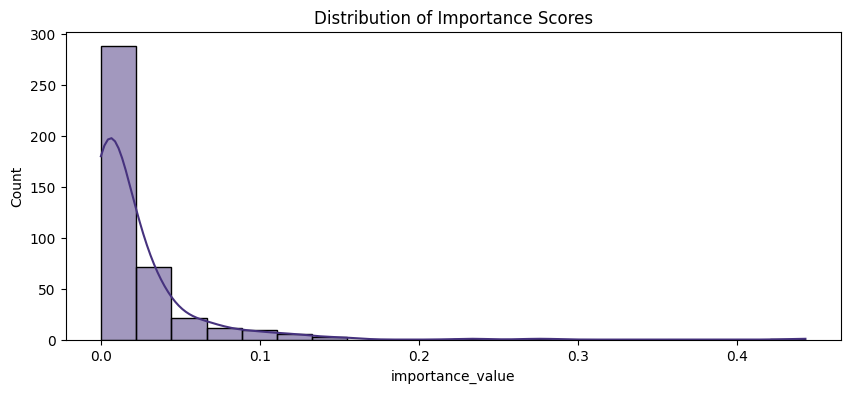

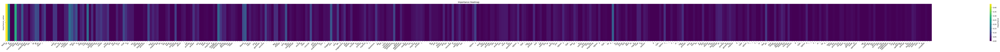

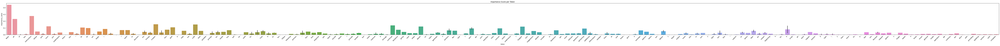

Top 10 Most Important Words:
             token  importance_value
0             Read          0.443014
4     instructions          0.276219
1              all          0.232519
28         Creator          0.153461
36           craft          0.150567
94       continual          0.137920
269             it          0.130228
7             once          0.123252
29               .          0.121340
106          Based          0.120151

Top 10 Least Important Words:
      token  importance_value
2        of               0.0
3       the               0.0
10     them               0.0
15       we               0.0
18       \n               0.0
19                        0.0
20       \n               0.0
23      you               0.0
25   become               0.0
32       is               0.0

Correlation between importance and position in text: -0.34
P-value: 0.00


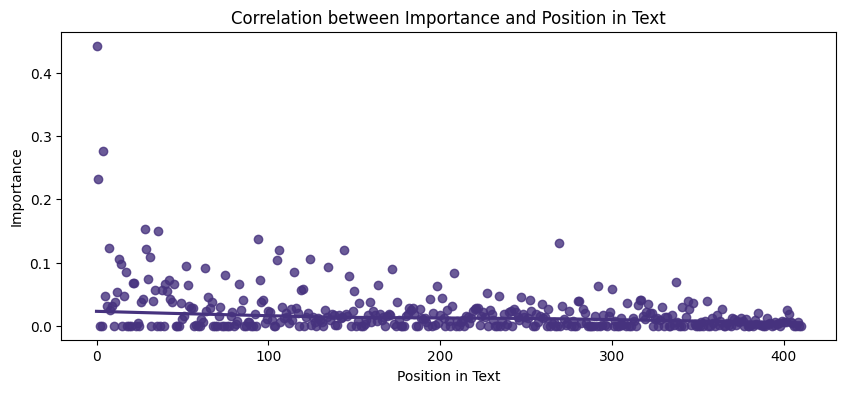

-----GPT-2 Embedded Ablated Log Scaled-----


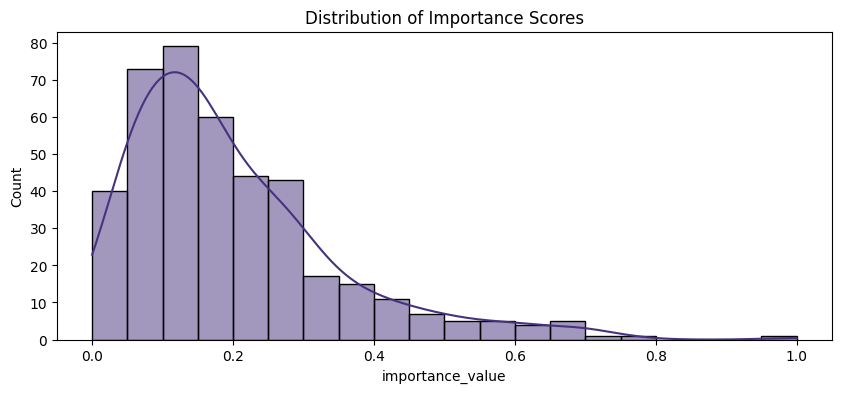

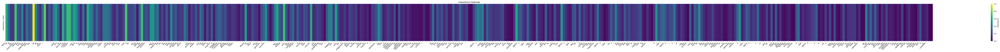

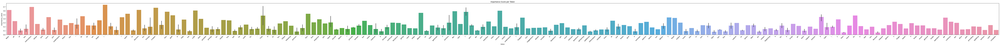

Top 10 Most Important Words:
             token  importance_value
12               "          1.000000
17              :"          0.753107
53            Chat          0.716468
4     instructions          0.698784
60             the          0.688627
123              (          0.680370
28         Creator          0.678164
27          Prompt          0.675944
25          become          0.623381
0             Read          0.622083

Top 10 Least Important Words:
        token  importance_value
410        \n          0.000000
409         .          0.013780
349   process          0.016769
398       the          0.018254
403    Prompt          0.018254
302    prompt          0.019733
379        \n          0.022672
380        \n          0.022672
224       the          0.024132
348      this          0.025586

Correlation between importance and position in text: -0.42
P-value: 0.00


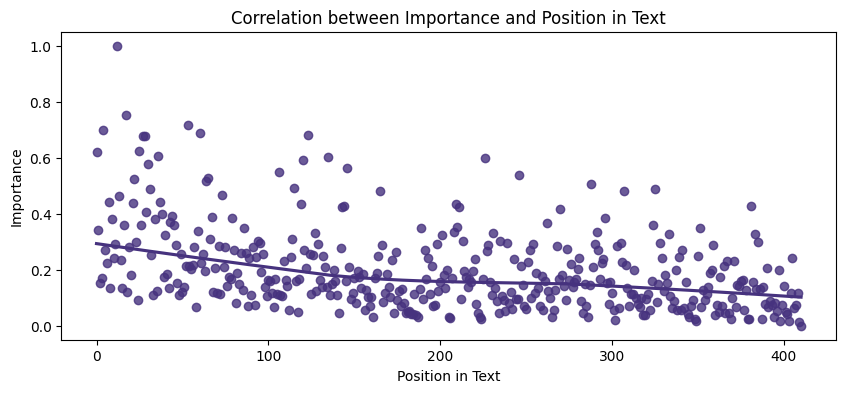




-----GPT-2 Embedded Log Scaled vs. Integrated Gradients-----


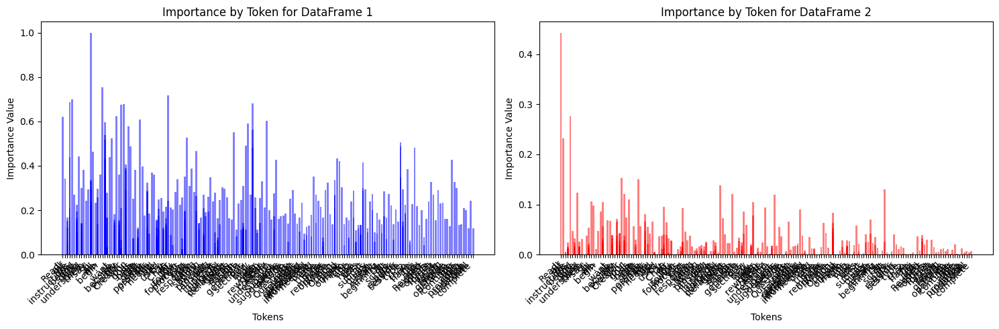

{'Pearson Correlation': 0.4275353926280483, 'Cosine Similarity': 0.6186448357844985, 'Euclidean Distance': 0.2246919761815784, "Kendall's Tau": 0.17003545179040078}


In [119]:
# Prompt 3 Result Analysis
print("-----Integrated Gradients Attributions-----")
analyze_heatmap(attribution_df3)
print("-----GPT-2 Embedded Ablated Log Scaled-----")
analyze_heatmap(importance_map_log_df3)

print("\n\n")

print("-----GPT-2 Embedded Log Scaled vs. Integrated Gradients-----")
print(compare_heatmaps(importance_map_log_df3, attribution_df3))

In [90]:
# Prompt 4
%time attribution_df4 = process_integrated_gradients(prompt4, gpt2tokenizer, model)
%time importance_map_df4, importance_map_log_df4 = process_importance(ablated_relative_importance, prompt4, gpt2tokenizer, model)

Calculating Integrated Gradients: 100%|█████████████████████████████████████████████| 100/100 [02:40<00:00,  1.61s/it]


CPU times: user 16min 50s, sys: 4min 48s, total: 21min 38s
Wall time: 2min 41s


Calculating Token Importances: 100%|████████████████████████████████████████████████| 340/340 [03:11<00:00,  1.77it/s]

CPU times: user 19min 57s, sys: 5min 57s, total: 25min 55s
Wall time: 3min 12s


-----Integrated Gradients Attributions-----


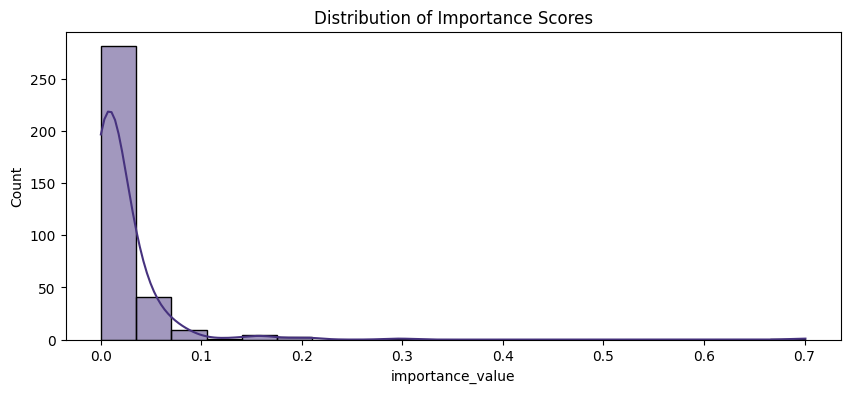

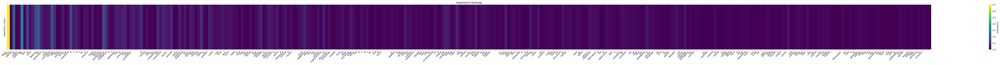

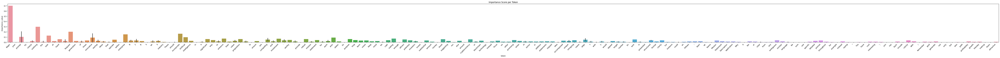

Top 10 Most Important Words:
           token  importance_value
0          Begin          0.700899
5      outlining          0.296461
2         prompt          0.204276
11       Request          0.200766
16    innovative          0.165677
35   incorporate          0.162792
23    enterprise          0.152707
10             .          0.151801
7           task          0.127035
36    Artificial          0.096884

Top 10 Least Important Words:
      token  importance_value
1      your               0.0
3        by               0.0
6       the               0.0
19     that               0.0
21   within               0.0
27        S               0.0
32    These               0.0
34   should               0.0
38       in               0.0
50       To               0.0

Correlation between importance and position in text: -0.37
P-value: 0.00


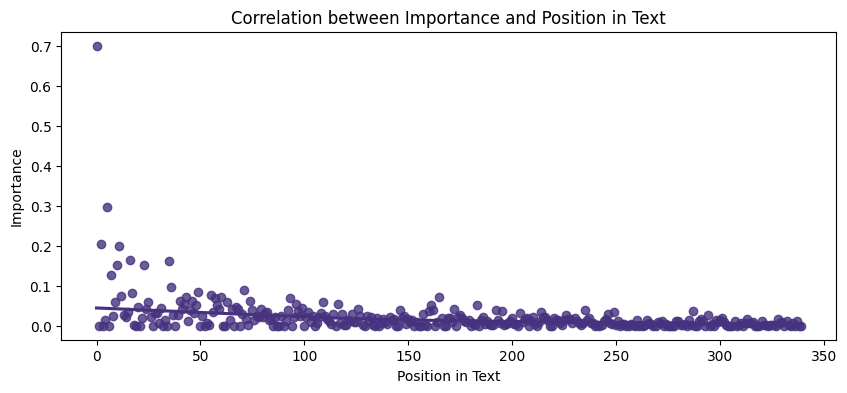

-----GPT-2 Embedded Ablated Log Scaled-----


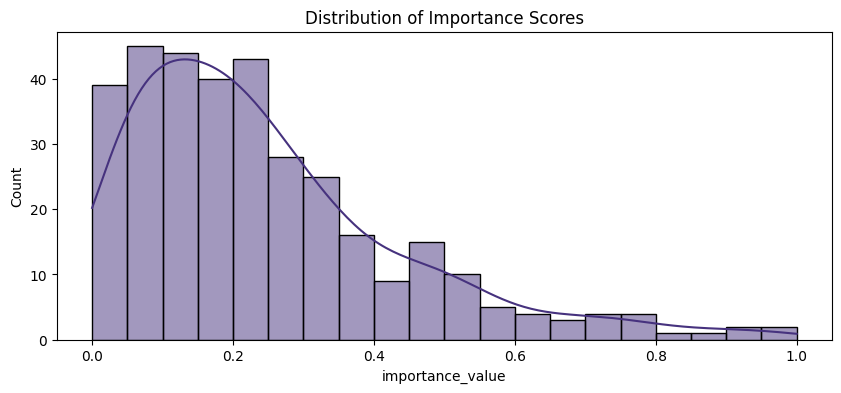

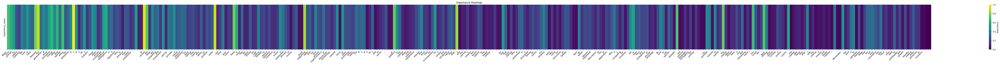

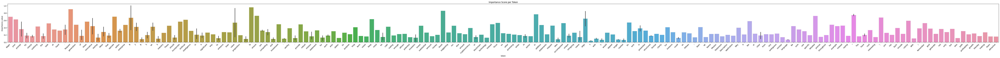

Top 10 Most Important Words:
        token  importance_value
24          B          1.000000
50         To          0.957357
76      value          0.928355
11    Request          0.904672
109     Avoid          0.862072
165     align          0.848209
10          .          0.793118
83          .          0.784533
263         "          0.767896
142        In          0.766303

Top 10 Least Important Words:
        token  importance_value
338         .          0.000000
339        \n          0.000000
288         ,          0.004664
336        to          0.016859
255        \n          0.019855
256        \n          0.019855
305        \n          0.019855
306        \n          0.019855
247         ,          0.024311
280   startup          0.025786

Correlation between importance and position in text: -0.37
P-value: 0.00


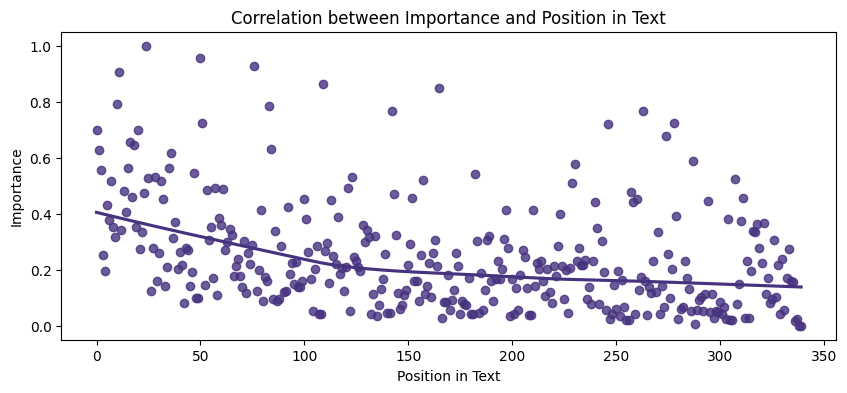




-----GPT-2 Embedded Log Scaled vs. Integrated Gradients-----


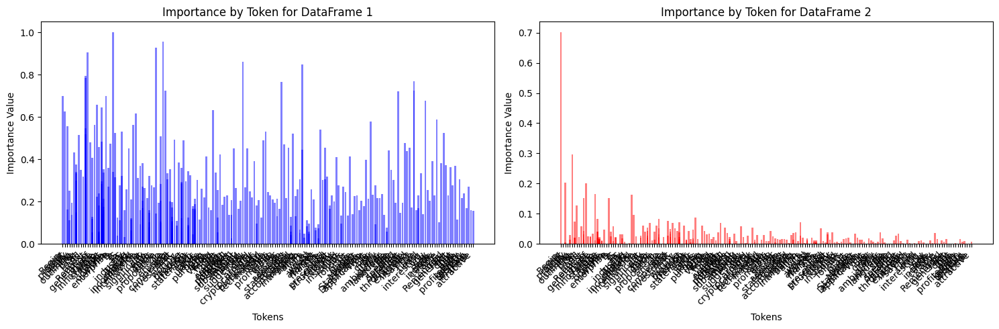

{'Pearson Correlation': 0.3299777822854857, 'Cosine Similarity': 0.5084521259424379, 'Euclidean Distance': 0.2880541627132423, "Kendall's Tau": 0.18396462538950392}


In [301]:
# Prompt 4 Result Analysis
print("-----Integrated Gradients Attributions-----")
analyze_heatmap(attribution_df4)
print("-----GPT-2 Embedded Ablated Log Scaled-----")
analyze_heatmap(importance_map_log_df4)

print("\n\n")

print("-----GPT-2 Embedded Log Scaled vs. Integrated Gradients-----")
print(compare_heatmaps(importance_map_log_df4, attribution_df4))

In [297]:
# Prompt 5
%time attribution_df5 = process_integrated_gradients(prompt5, gpt2tokenizer, model)
%time importance_map_df5, importance_map_log_df5 = process_importance(ablated_relative_importance, prompt5, gpt2tokenizer, model)

Calculating Integrated Gradients: 100%|██████████████████████████████████████████████| 100/100 [01:45<00:00,  1.06s/it]


CPU times: user 5min 30s, sys: 1min 54s, total: 7min 24s
Wall time: 1min 46s


Calculating Token Importances: 100%|███████████████████████████████████████████████████| 87/87 [00:26<00:00,  3.32it/s]

CPU times: user 1min 37s, sys: 36.3 s, total: 2min 14s
Wall time: 26.5 s


-----Integrated Gradients Attributions-----


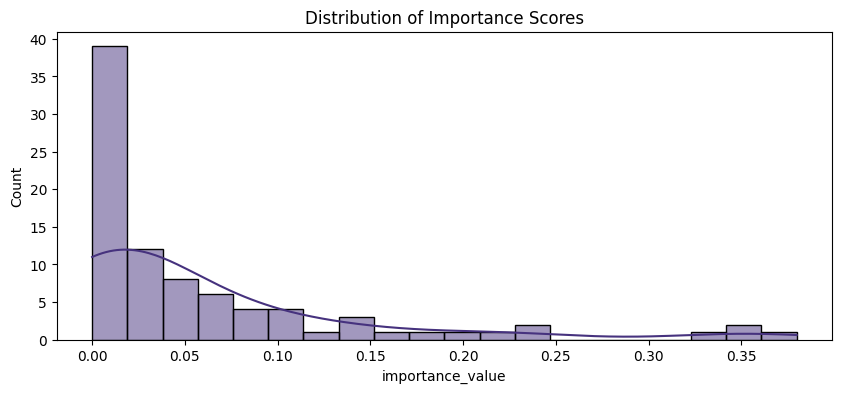

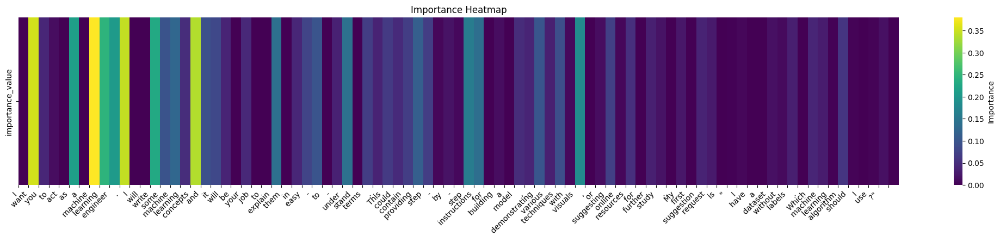

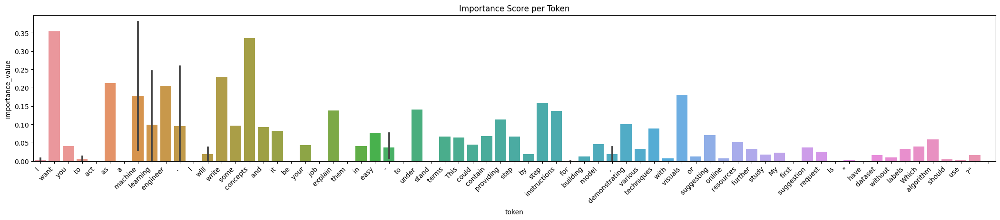

Top 10 Most Important Words:
        token  importance_value
7     machine          0.379863
1        want          0.354457
10          .          0.344544
17   concepts          0.335970
8    learning          0.245345
13      write          0.229421
5          as          0.213031
9    engineer          0.205199
55    visuals          0.181077
44       step          0.158123

Top 10 Least Important Words:
    token  importance_value
0       I               0.0
4     act               0.0
6       a               0.0
11      I               0.0
12   will               0.0
21     be               0.0
23    job               0.0
24     to               0.0
26   them               0.0
30     to               0.0

Correlation between importance and position in text: -0.46
P-value: 0.00


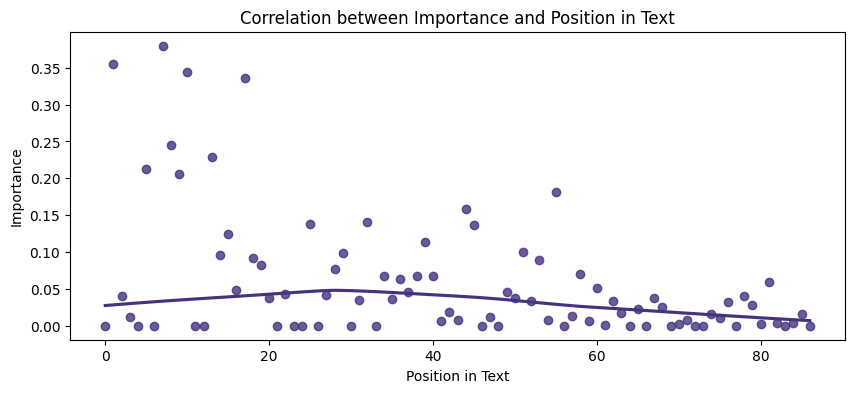

-----GPT-2 Embedded Ablated Log Scaled-----


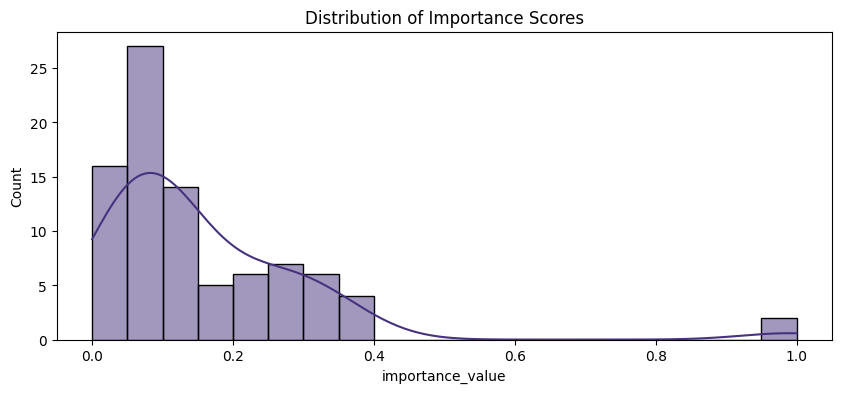

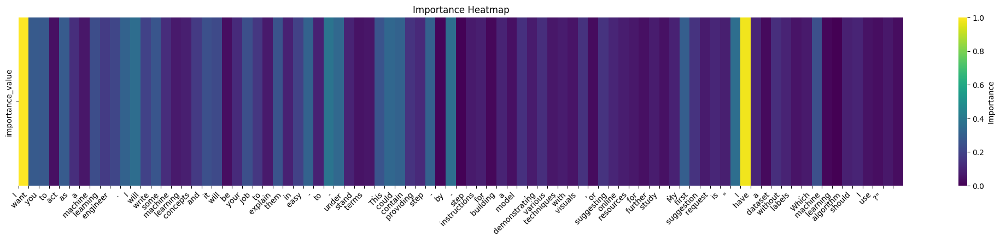

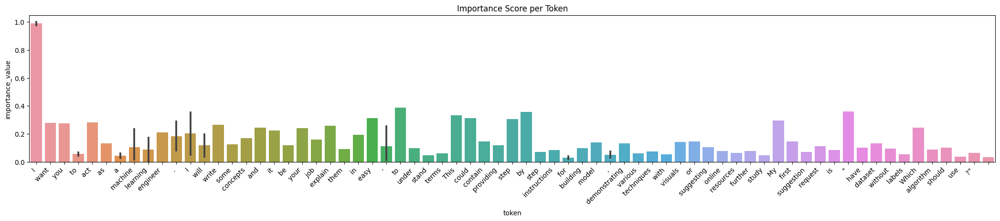

Top 10 Most Important Words:
    token  importance_value
0       I          1.000000
71      I          0.977701
30     to          0.386701
70      "          0.359086
42     by          0.356844
11      I          0.354509
31      -          0.332500
36   This          0.331625
10      .          0.312055
28   easy          0.311480

Top 10 Least Important Words:
        token  importance_value
80   learning          0.000000
43          -          0.006156
41          -          0.014407
79    machine          0.016387
46        for          0.018356
73          a          0.024501
56          ,          0.029039
86         \n          0.034013
20       will          0.035982
84        use          0.037550

Correlation between importance and position in text: -0.29
P-value: 0.01


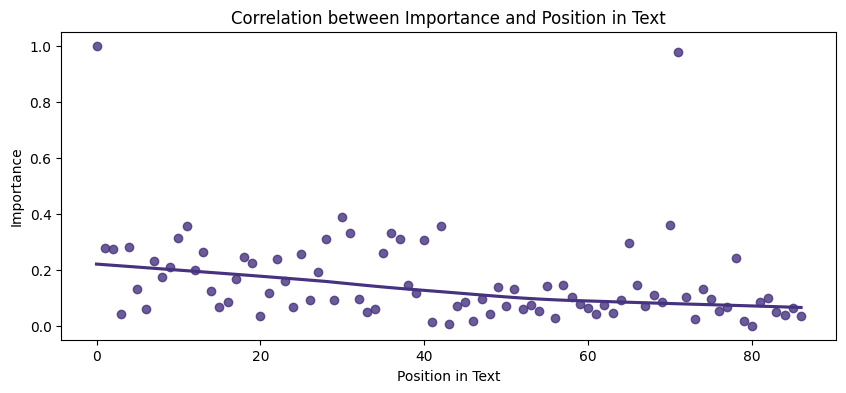




-----GPT-2 Embedded Log Scaled vs. Integrated Gradients-----


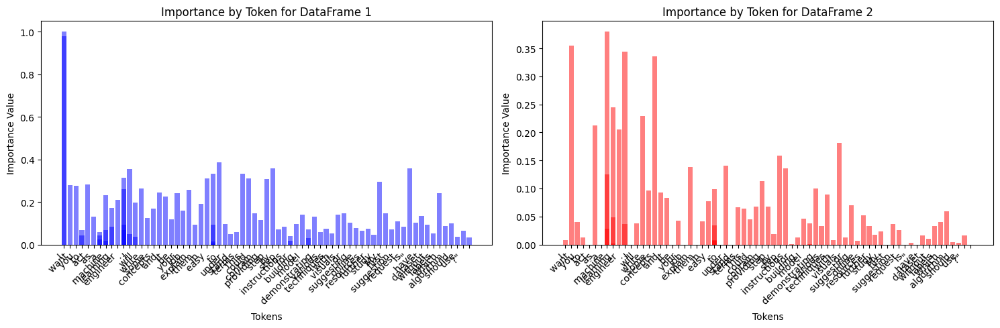

{'Pearson Correlation': 0.10080845461421373, 'Cosine Similarity': 0.4581378382870213, 'Euclidean Distance': 0.20238063377212454, "Kendall's Tau": 0.20668708756615176}


In [298]:
# Prompt 5 Result Analysis
print("-----Integrated Gradients Attributions-----")
analyze_heatmap(attribution_df5)
print("-----GPT-2 Embedded Ablated Log Scaled-----")
analyze_heatmap(importance_map_log_df5)

print("\n\n")

print("-----GPT-2 Embedded Log Scaled vs. Integrated Gradients-----")
print(compare_heatmaps(importance_map_log_df5, attribution_df5))

## GPT-3 Embedding vs. GPT-2 Integrated Gradients

In [94]:
gpt3tokenizer = tiktoken.get_encoding("cl100k_base")

In [97]:
# Prompt 1
# We already calculated attribution_df1 above, so no need to do it again
# %time attribution_df1 = process_integrated_gradients(prompt1, gpt2tokenizer, model)
%time gpt3_importance_map_df1, gpt3_importance_map_log_df1 = process_importance(ablated_relative_importance, prompt1, gpt3tokenizer)

Calculating Token Importances: 100%|████████████████████████████████████████████████| 277/277 [00:48<00:00,  5.71it/s]

CPU times: user 3.75 s, sys: 551 ms, total: 4.31 s
Wall time: 48.9 s


-----Integrated Gradients Attributions-----


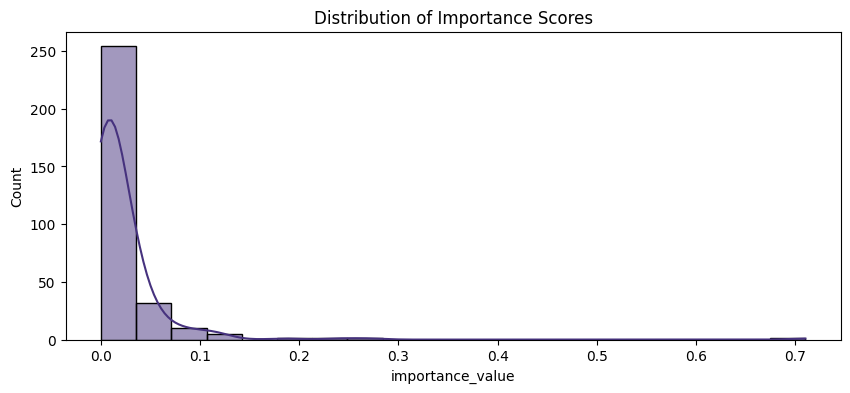

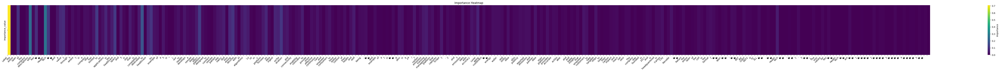

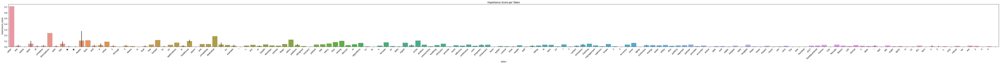

Top 10 Most Important Words:
            token  importance_value
0           Label          0.710328
12         Health          0.269872
7    descriptions          0.240725
44      dedicated          0.185751
63         ostics          0.124504
29        limited          0.118536
35     healthcare          0.118189
13           Tech          0.111698
90          orche          0.108430
47              .          0.105833

Top 10 Least Important Words:
       token  importance_value
1        the               0.0
2     entire               0.0
4         of               0.0
5        the               0.0
10         �               0.0
11         �               0.0
14         �               0.0
15         �               0.0
20   through               0.0
24        is               0.0

Correlation between importance and position in text: -0.34
P-value: 0.00


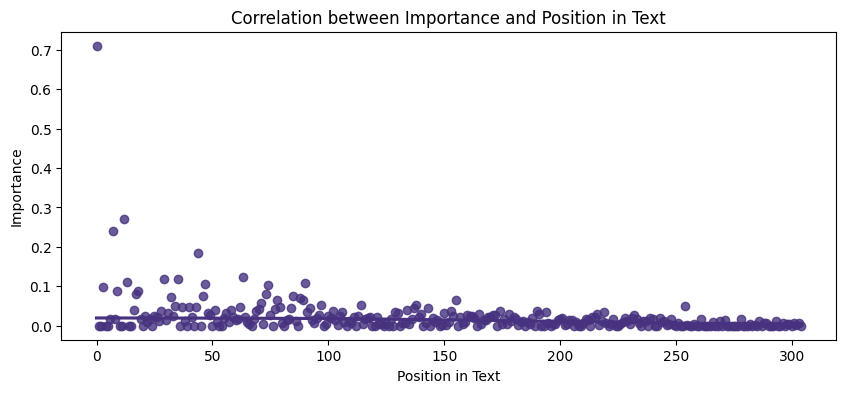

-----GPT-3 Embedded Ablated Log Scaled-----


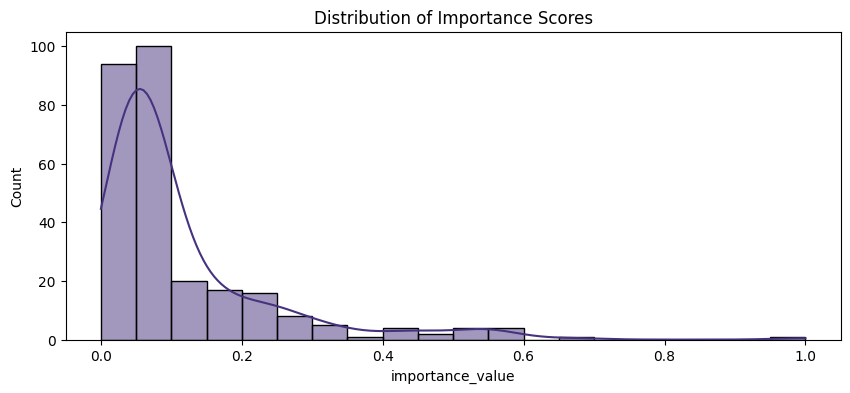

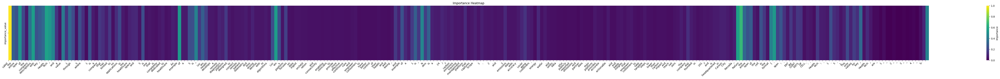

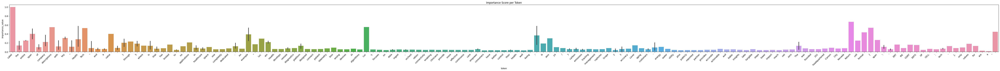

Top 10 Most Important Words:
             token  importance_value
0            Label          1.000000
220         Return          0.668464
219             .”          0.572061
11          Health          0.569237
80             Luc          0.552858
7     descriptions          0.551805
230              {          0.536743
51         example          0.533330
12            Tech          0.531251
3             span          0.511822

Top 10 Least Important Words:
    token  importance_value
270     ”          0.000000
267     ”          0.000901
265     “          0.001491
268     “          0.002133
273     ”          0.002997
264     ”          0.003085
271     “          0.005797
269     3          0.010796
262     “          0.011183
266     2          0.013059

Correlation between importance and position in text: -0.24
P-value: 0.00


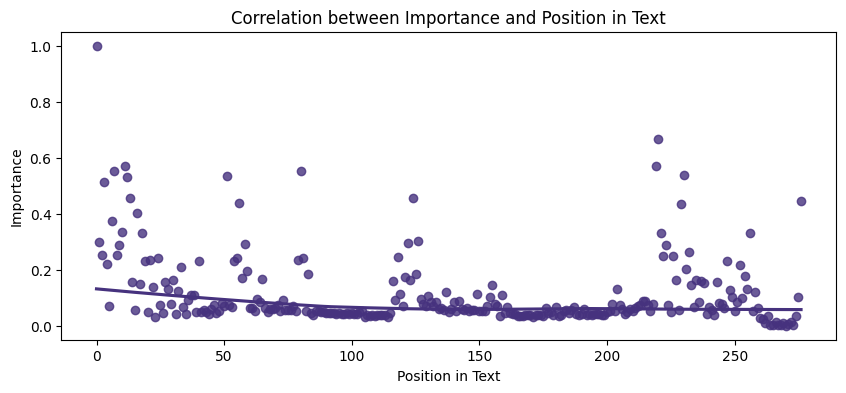




-----GPT-3 Embedded Log Scaled vs. Integrated Gradients-----


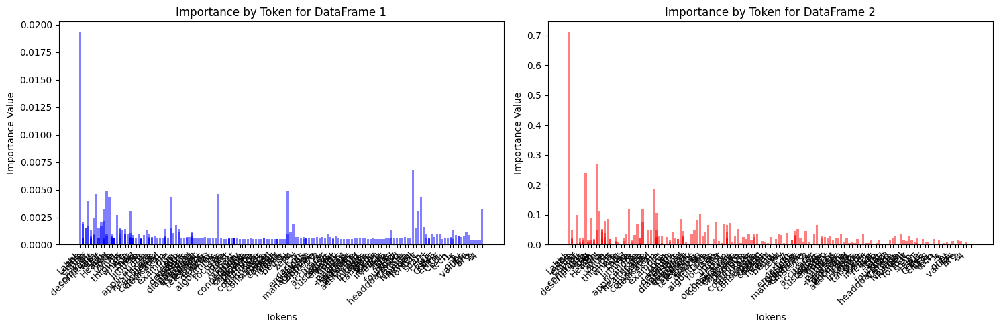

{'Pearson Correlation': 0.7328395616343821, 'Cosine Similarity': 0.7866151068574092, 'Euclidean Distance': 0.058388875113526924, "Kendall's Tau": 0.04073523238821435}


In [281]:
# Prompt 1 Analysis
a2b, b2a = tokenizations.get_alignments(gpt3_importance_map_df1['token'].values.tolist(), attribution_df1['token'].values.tolist())
aligned_dfa1, aligned_dfb1 = align_dataframes(b2a, gpt3_importance_map_df1, a2b, attribution_df1)

print("-----Integrated Gradients Attributions-----")
analyze_heatmap(attribution_df1)
print("-----GPT-3 Embedded Ablated Log Scaled-----")
analyze_heatmap(gpt3_importance_map_log_df1)

print("\n\n")

print("-----GPT-3 Embedded Log Scaled vs. Integrated Gradients-----")
print(compare_heatmaps(aligned_dfa1, aligned_dfb1))


In [98]:
# Prompt 2
# We already calculated attribution_df2 above, so no need to do it again
# %time attribution_df2 = process_integrated_gradients(prompt2, gpt2tokenizer, model)
%time gpt3_importance_map_df2, gpt3_importance_map_log_df2 = process_importance(ablated_relative_importance, prompt2, gpt3tokenizer)

Calculating Token Importances: 100%|██████████████████████████████████████████████████| 56/56 [00:09<00:00,  5.91it/s]

CPU times: user 842 ms, sys: 118 ms, total: 960 ms
Wall time: 9.62 s


-----Integrated Gradients Attributions-----


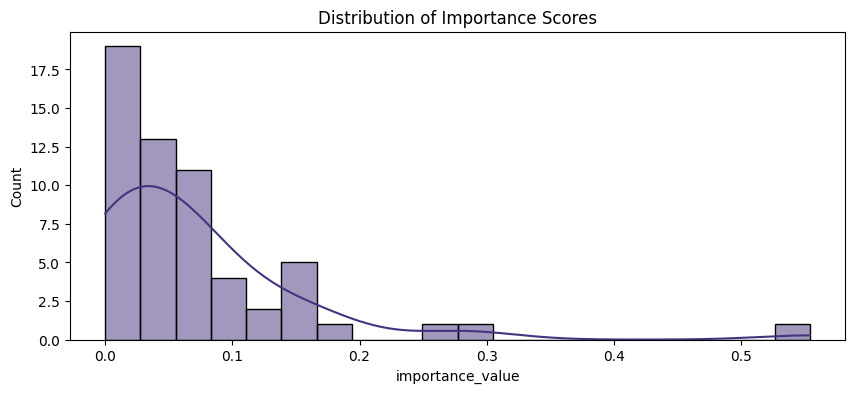

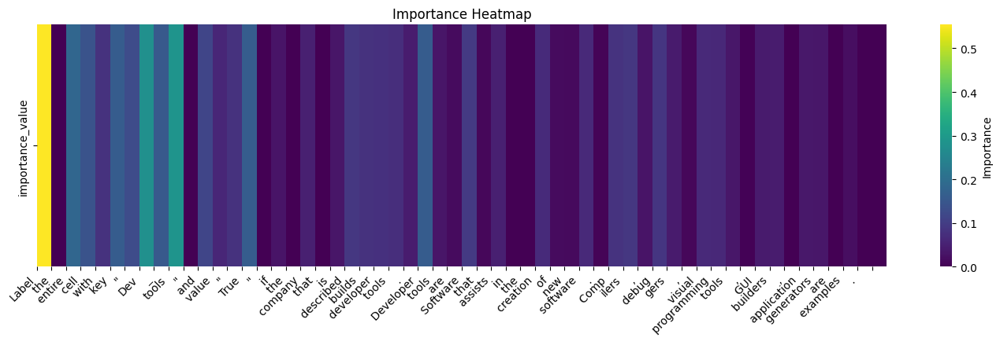

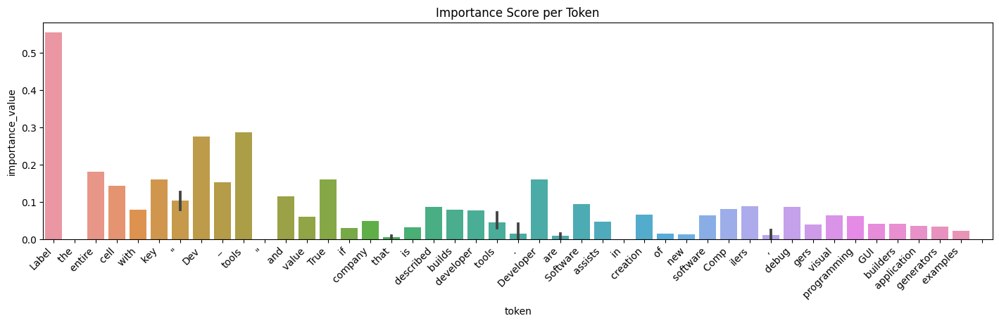

Top 10 Most Important Words:
         token  importance_value
0        Label          0.554155
9        tools          0.287086
7          Dev          0.275970
2       entire          0.180749
14        True          0.160856
26   Developer          0.159776
5          key          0.159592
8            _          0.153106
3         cell          0.142829
6            "          0.126864

Top 10 Least Important Words:
    token  importance_value
1     the               0.0
10      "               0.0
15      "               0.0
17    the               0.0
19   that               0.0
32     in               0.0
33    the               0.0
51      ,               0.0
56      .               0.0
57     \n               0.0

Correlation between importance and position in text: -0.52
P-value: 0.00


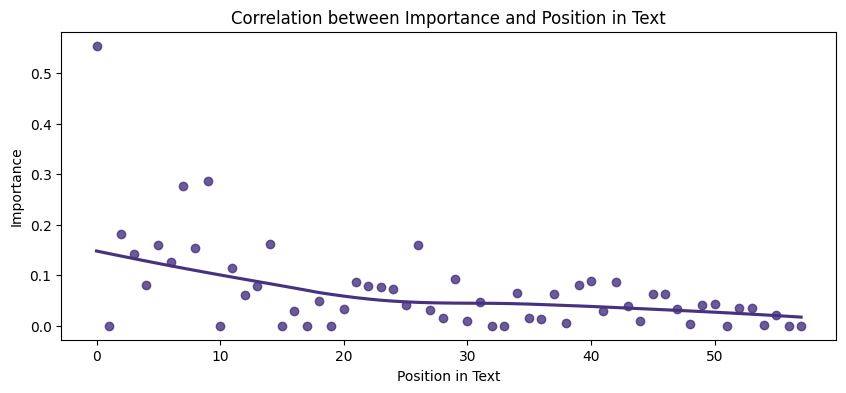

-----GPT-3 Embedded Ablated Log Scaled-----


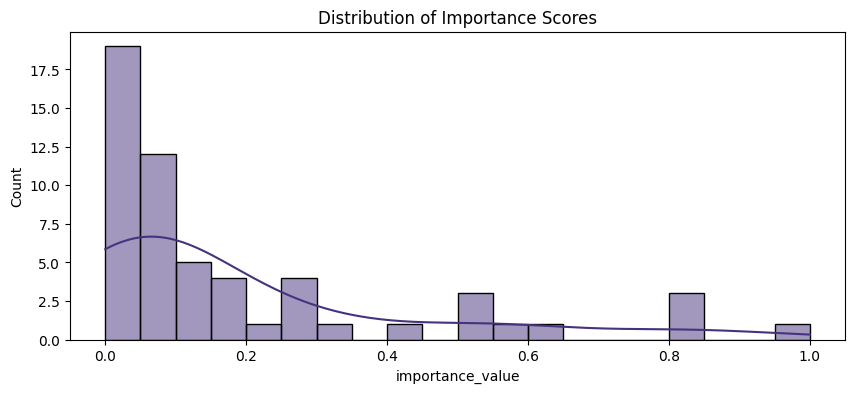

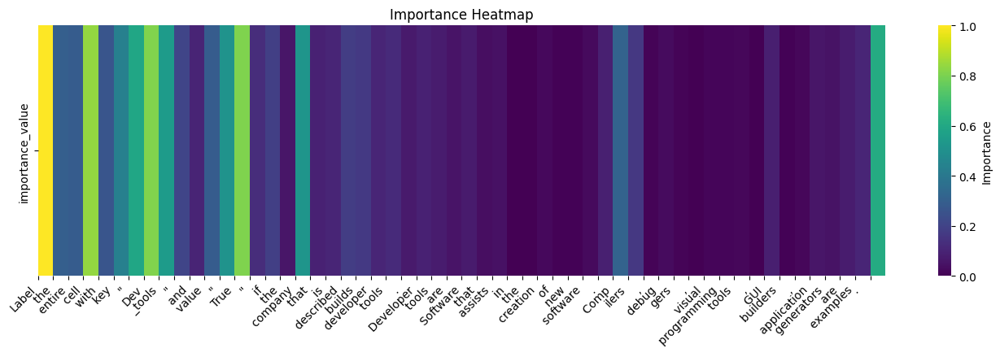

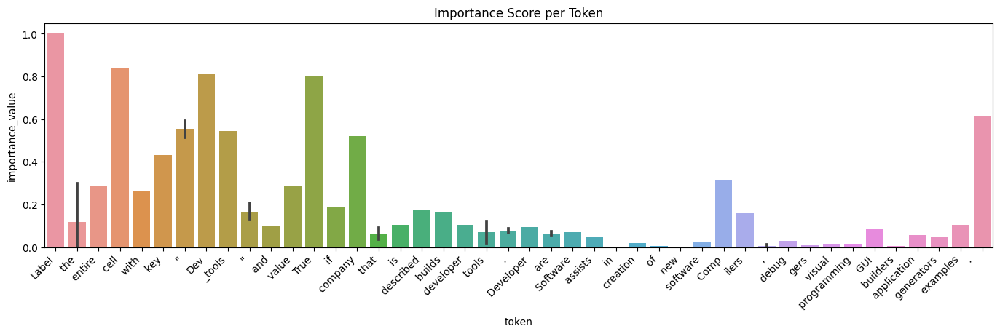

Top 10 Most Important Words:
       token  importance_value
0      Label          1.000000
3       cell          0.839639
7        Dev          0.810892
13      True          0.804888
55       .\n          0.612629
6          "          0.592954
8     _tools          0.546154
17   company          0.521934
12         "          0.514944
5        key          0.431489

Top 10 Least Important Words:
           token  importance_value
32           the          0.000000
31            in          0.002138
47             ,          0.002270
43             ,          0.003418
35           new          0.004490
49      builders          0.004889
34            of          0.004936
40             ,          0.007877
42          gers          0.009277
45   programming          0.014417

Correlation between importance and position in text: -0.59
P-value: 0.00


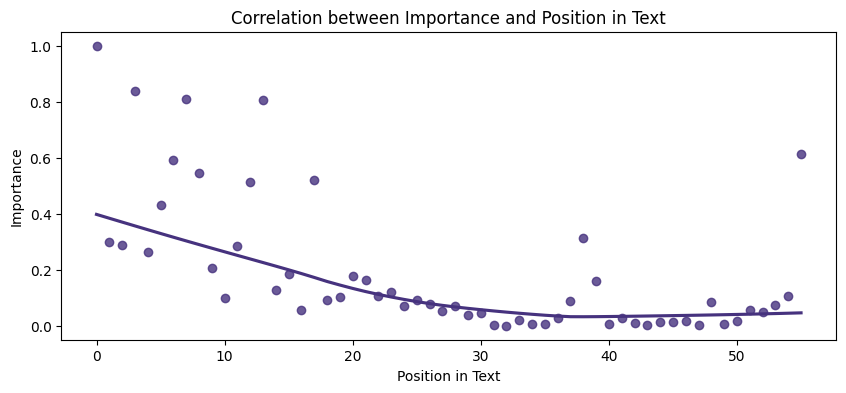




-----GPT-3 Embedded Log Scaled vs. Integrated Gradients-----


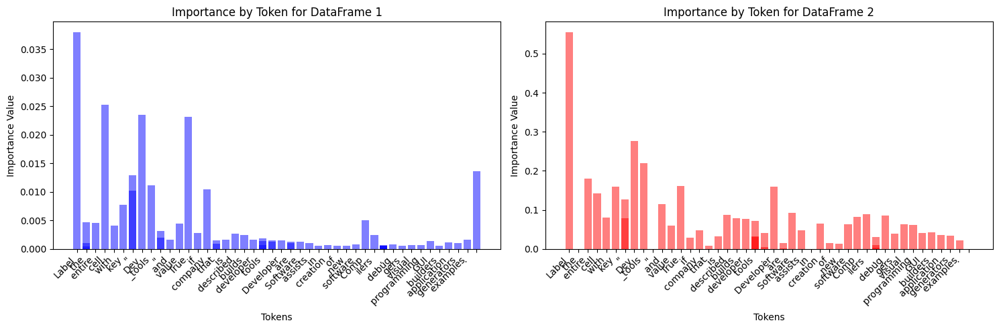

{'Pearson Correlation': 0.7890447665545981, 'Cosine Similarity': 0.8515749082453942, 'Euclidean Distance': 0.10450438340610692, "Kendall's Tau": 0.36927681129478496}


In [283]:
# Prompt 2 Analysis
a2b, b2a = tokenizations.get_alignments(gpt3_importance_map_df2['token'].values.tolist(), attribution_df2['token'].values.tolist())
aligned_dfa2, aligned_dfb2 = align_dataframes(b2a, gpt3_importance_map_df2, a2b, attribution_df2)

print("-----Integrated Gradients Attributions-----")
analyze_heatmap(attribution_df2)
print("-----GPT-3 Embedded Ablated Log Scaled-----")
analyze_heatmap(gpt3_importance_map_log_df2)

print("\n\n")

print("-----GPT-3 Embedded Log Scaled vs. Integrated Gradients-----")
print(compare_heatmaps(aligned_dfa2, aligned_dfb2))


In [105]:
# Prompt 3
# We already calculated attribution_df3 above, so no need to do it again
# %time attribution_df3 = process_integrated_gradients(prompt3, gpt2tokenizer, model)
%time gpt3_importance_map_df3, gpt3_importance_map_log_df3 = process_importance(ablated_relative_importance, prompt3, gpt3tokenizer)

Calculating Token Importances: 100%|████████████████████████████████████████████████| 396/396 [01:08<00:00,  5.79it/s]

CPU times: user 5.18 s, sys: 763 ms, total: 5.95 s
Wall time: 1min 8s


-----Integrated Gradients Attributions-----


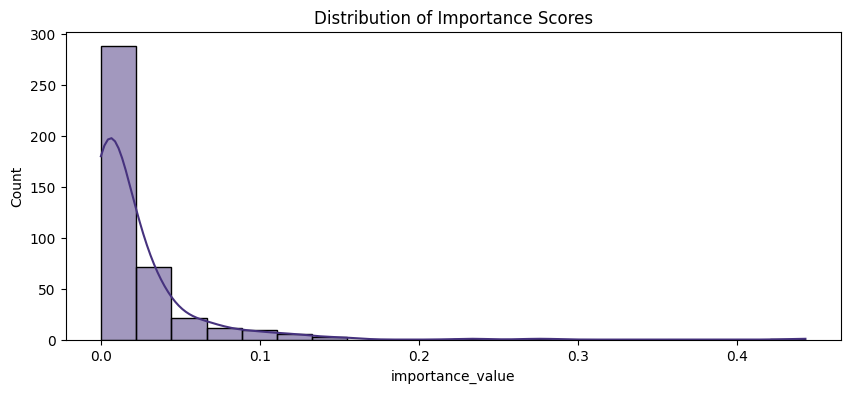

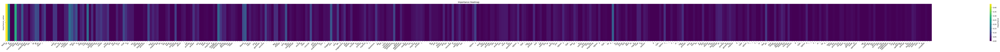

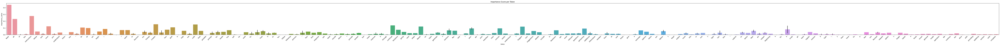

Top 10 Most Important Words:
             token  importance_value
0             Read          0.443014
4     instructions          0.276219
1              all          0.232519
28         Creator          0.153461
36           craft          0.150567
94       continual          0.137920
269             it          0.130228
7             once          0.123252
29               .          0.121340
106          Based          0.120151

Top 10 Least Important Words:
      token  importance_value
2        of               0.0
3       the               0.0
10     them               0.0
15       we               0.0
18       \n               0.0
19                        0.0
20       \n               0.0
23      you               0.0
25   become               0.0
32       is               0.0

Correlation between importance and position in text: -0.34
P-value: 0.00


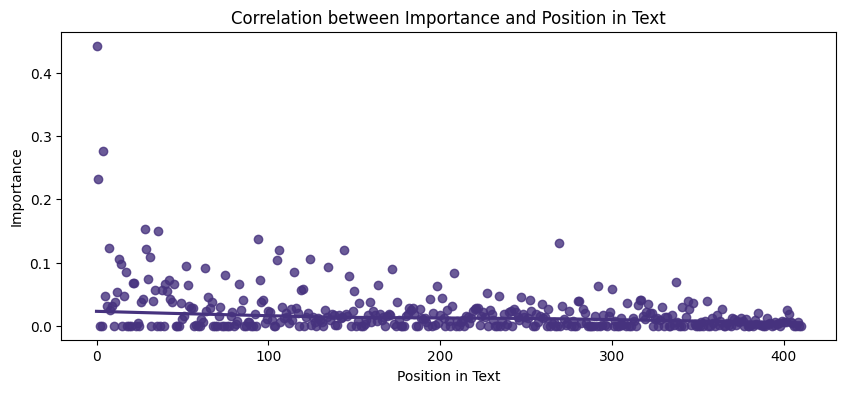

-----GPT-3 Embedded Ablated Log Scaled-----


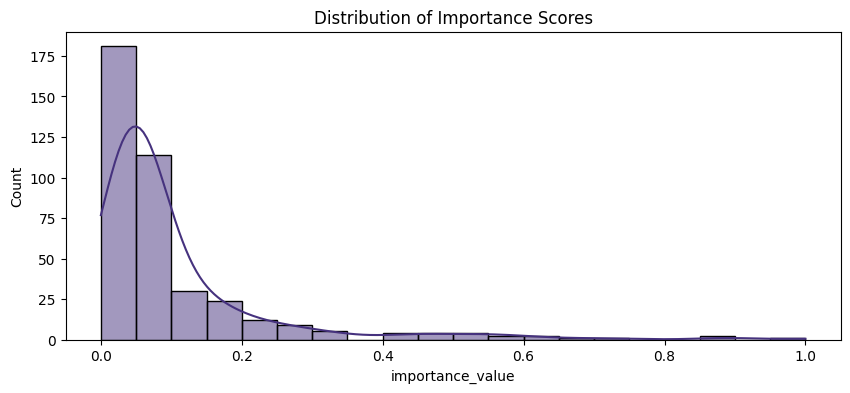

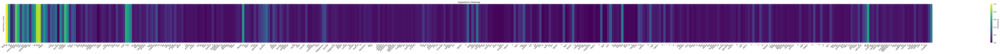

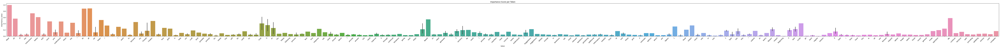

Top 10 Most Important Words:
             token  importance_value
0             Read          1.000000
14             all          0.889517
13              Sh          0.883072
4     instructions          0.734699
25          Prompt          0.677741
51            Chat          0.613128
5            below          0.610850
368             We          0.580406
1              all          0.563129
52               G          0.541964

Top 10 Least Important Words:
          token  importance_value
255           :          0.000000
229        this          0.000949
239           :          0.004406
249         the          0.005344
22           to          0.005673
269     regular          0.007160
39          for          0.007324
250   beginning          0.007349
256        Type          0.008162
211          of          0.009953

Correlation between importance and position in text: -0.34
P-value: 0.00


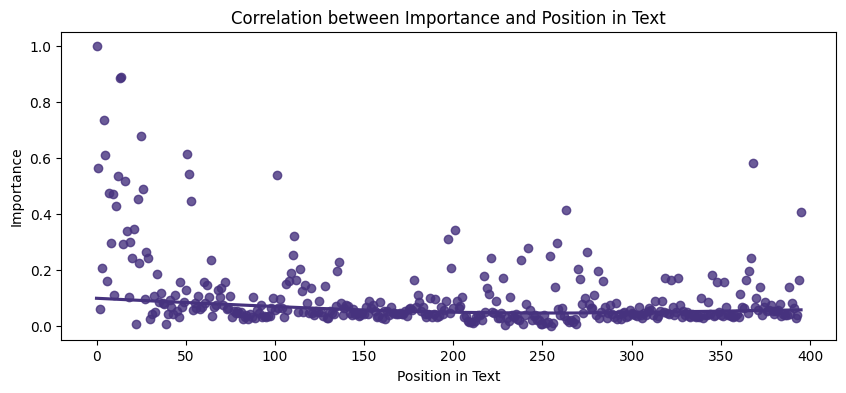




-----GPT-3 Embedded Log Scaled vs. Integrated Gradients-----


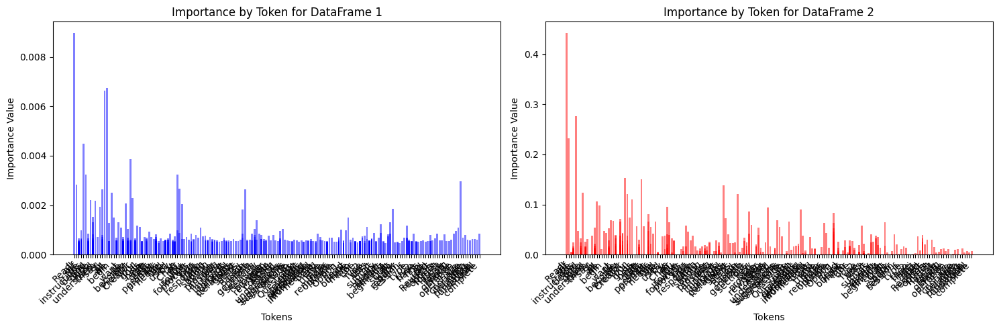

{'Pearson Correlation': 0.6434548103511122, 'Cosine Similarity': 0.7457817334882594, 'Euclidean Distance': 0.04240537812992499, "Kendall's Tau": 0.15707790927275095}


In [284]:
# Prompt 3 Analysis
a2b, b2a = tokenizations.get_alignments(gpt3_importance_map_df3['token'].values.tolist(), attribution_df3['token'].values.tolist())
aligned_dfa3, aligned_dfb3 = align_dataframes(b2a, gpt3_importance_map_df3, a2b, attribution_df3)

print("-----Integrated Gradients Attributions-----")
analyze_heatmap(attribution_df3)
print("-----GPT-3 Embedded Ablated Log Scaled-----")
analyze_heatmap(gpt3_importance_map_log_df3)

print("\n\n")

print("-----GPT-3 Embedded Log Scaled vs. Integrated Gradients-----")
print(compare_heatmaps(aligned_dfa3, aligned_dfb3))


In [107]:
# Prompt 4
# We already calculated attribution_df4 above, so no need to do it again
# %time attribution_df4 = process_integrated_gradients(prompt4, gpt2tokenizer, model)
%time gpt3_importance_map_df4, gpt3_importance_map_log_df4 = process_importance(ablated_relative_importance, prompt4, gpt3tokenizer)

Calculating Token Importances: 100%|████████████████████████████████████████████████| 318/318 [00:53<00:00,  5.92it/s]

CPU times: user 4.23 s, sys: 757 ms, total: 4.99 s
Wall time: 53.9 s


-----Integrated Gradients Attributions-----


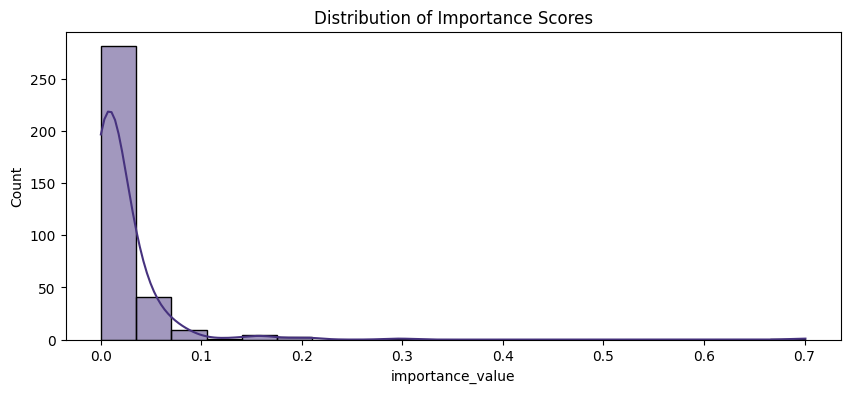

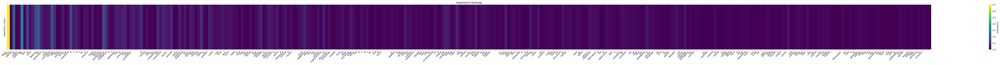

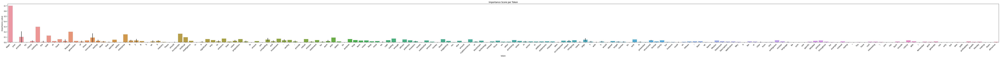

Top 10 Most Important Words:
           token  importance_value
0          Begin          0.700899
5      outlining          0.296461
2         prompt          0.204276
11       Request          0.200766
16    innovative          0.165677
35   incorporate          0.162792
23    enterprise          0.152707
10             .          0.151801
7           task          0.127035
36    Artificial          0.096884

Top 10 Least Important Words:
      token  importance_value
1      your               0.0
3        by               0.0
6       the               0.0
19     that               0.0
21   within               0.0
27        S               0.0
32    These               0.0
34   should               0.0
38       in               0.0
50       To               0.0

Correlation between importance and position in text: -0.37
P-value: 0.00


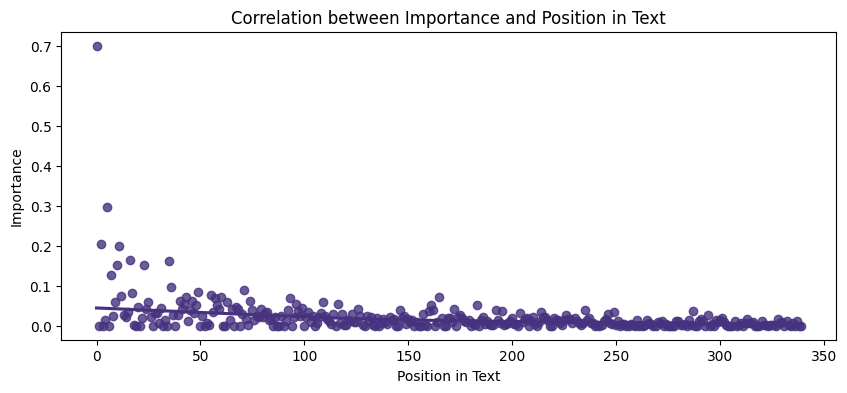

-----GPT-3 Embedded Ablated Log Scaled-----


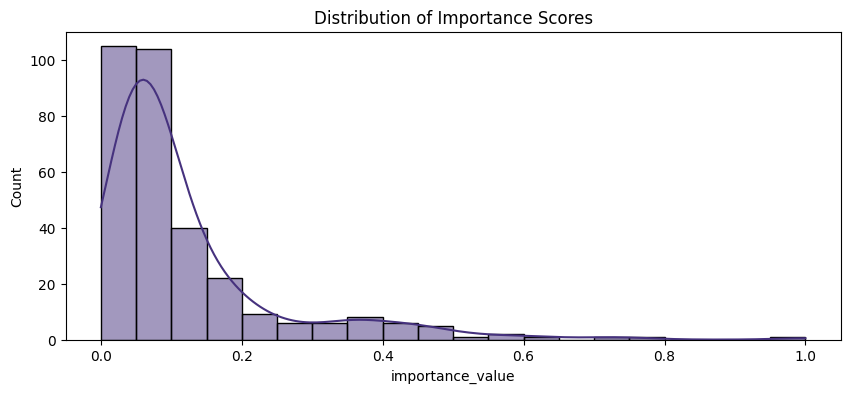

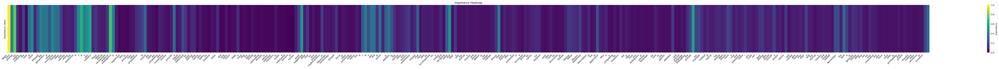

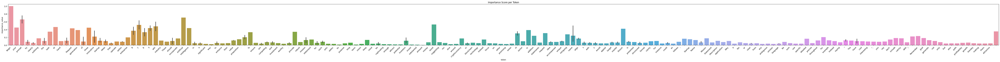

Top 10 Most Important Words:
           token  importance_value
0          Begin          1.000000
2         prompt          0.753445
35    Artificial          0.706707
25             2          0.628422
28           aaS          0.595284
236       prompt          0.563844
101        Avoid          0.529300
27             S          0.498736
152         name          0.497320
8             at          0.466379

Top 10 Least Important Words:
           token  importance_value
98            of          0.000000
97        amount          0.005285
96   substantial          0.010697
73             ,          0.011870
69           its          0.013669
76         -term          0.014330
74           and          0.014556
86            be          0.015502
41            to          0.015785
38             a          0.016483

Correlation between importance and position in text: -0.27
P-value: 0.00


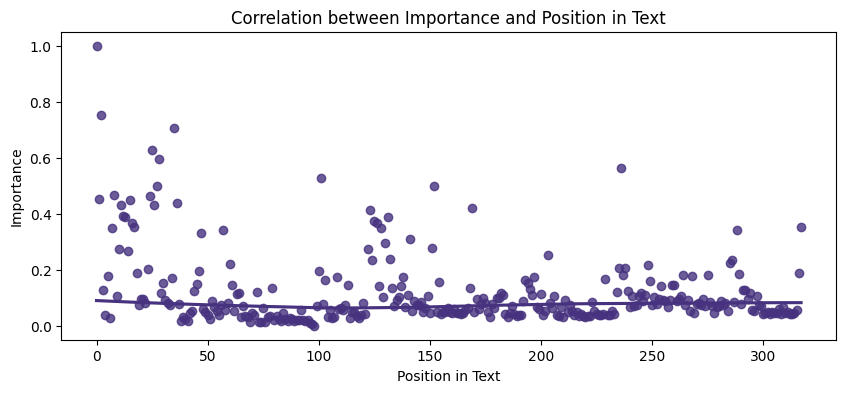




-----GPT-3 Embedded Log Scaled vs. Integrated Gradients-----


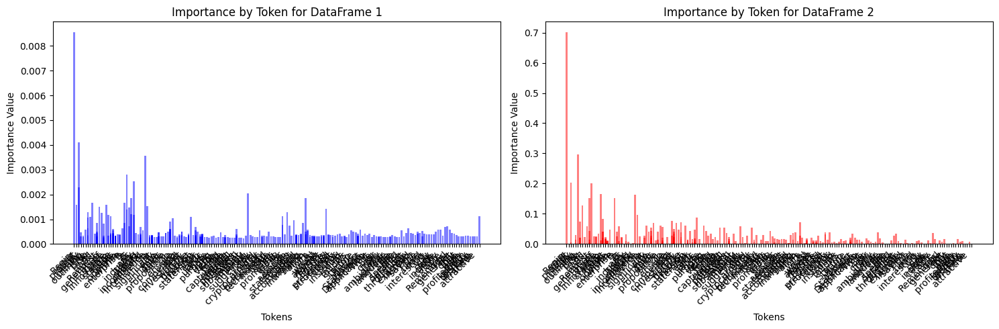

{'Pearson Correlation': 0.6965316152372855, 'Cosine Similarity': 0.7486551225801388, 'Euclidean Distance': 0.05443346000775432, "Kendall's Tau": 0.0816026836737158}


In [285]:
# Prompt 4 Analysis
a2b, b2a = tokenizations.get_alignments(gpt3_importance_map_df4['token'].values.tolist(), attribution_df4['token'].values.tolist())
aligned_dfa4, aligned_dfb4 = align_dataframes(b2a, gpt3_importance_map_df4, a2b, attribution_df4)

print("-----Integrated Gradients Attributions-----")
analyze_heatmap(attribution_df4)
print("-----GPT-3 Embedded Ablated Log Scaled-----")
analyze_heatmap(gpt3_importance_map_log_df4)

print("\n\n")

print("-----GPT-3 Embedded Log Scaled vs. Integrated Gradients-----")
print(compare_heatmaps(aligned_dfa4, aligned_dfb4))


In [302]:
# Prompt 5
# We already calculated attribution_df4 above, so no need to do it again
# %time attribution_df5 = process_integrated_gradients(prompt5, gpt2tokenizer, model)
%time gpt3_importance_map_df5, gpt3_importance_map_log_df5 = process_importance(ablated_relative_importance, prompt5, gpt3tokenizer)

Calculating Token Importances: 100%|███████████████████████████████████████████████████| 82/82 [00:17<00:00,  4.63it/s]

CPU times: user 959 ms, sys: 181 ms, total: 1.14 s
Wall time: 17.9 s


-----Integrated Gradients Attributions-----


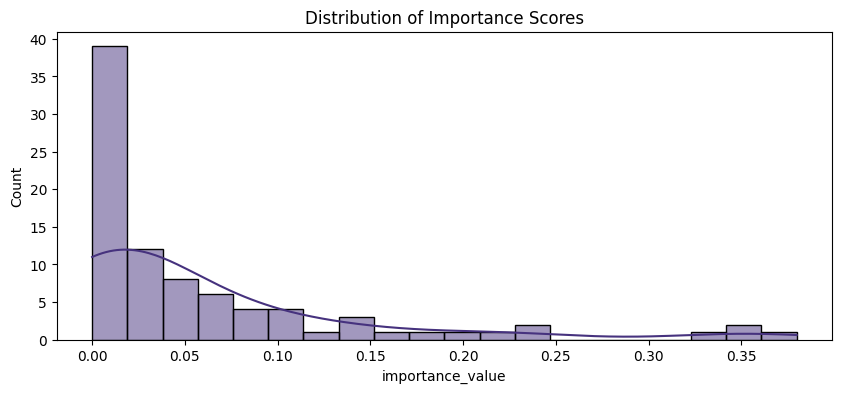

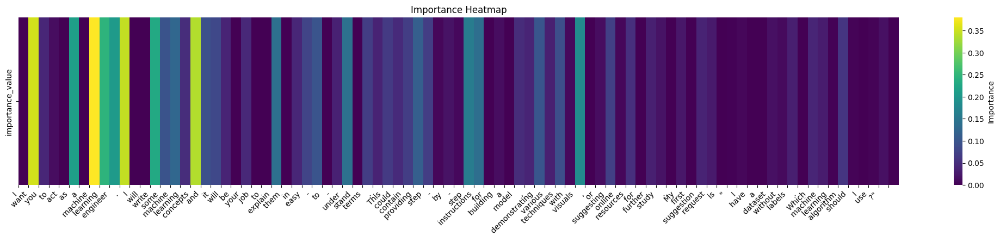

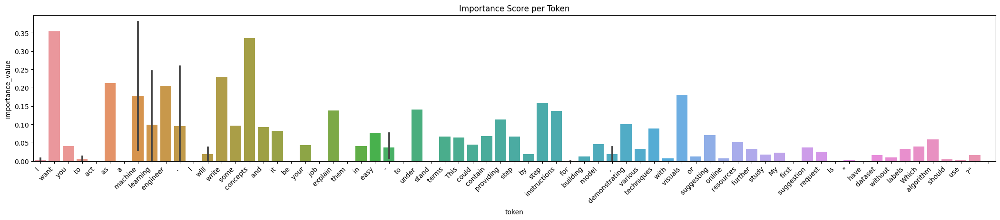

Top 10 Most Important Words:
        token  importance_value
7     machine          0.379863
1        want          0.354457
10          .          0.344544
17   concepts          0.335970
8    learning          0.245345
13      write          0.229421
5          as          0.213031
9    engineer          0.205199
55    visuals          0.181077
44       step          0.158123

Top 10 Least Important Words:
    token  importance_value
0       I               0.0
4     act               0.0
6       a               0.0
11      I               0.0
12   will               0.0
21     be               0.0
23    job               0.0
24     to               0.0
26   them               0.0
30     to               0.0

Correlation between importance and position in text: -0.46
P-value: 0.00


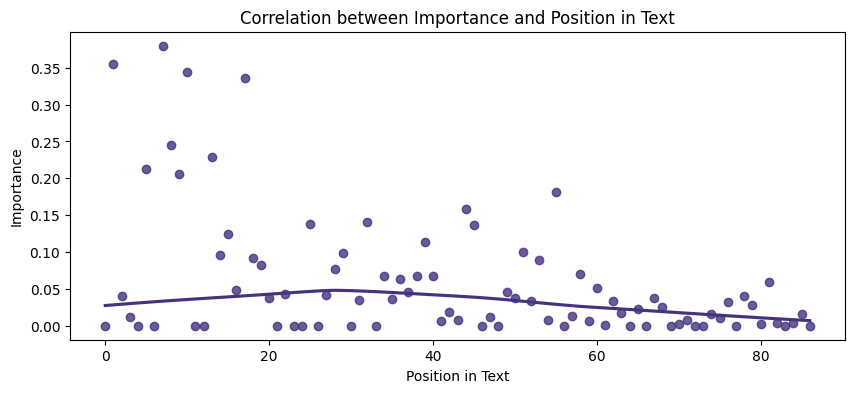

-----GPT-3 Embedded Ablated Log Scaled-----


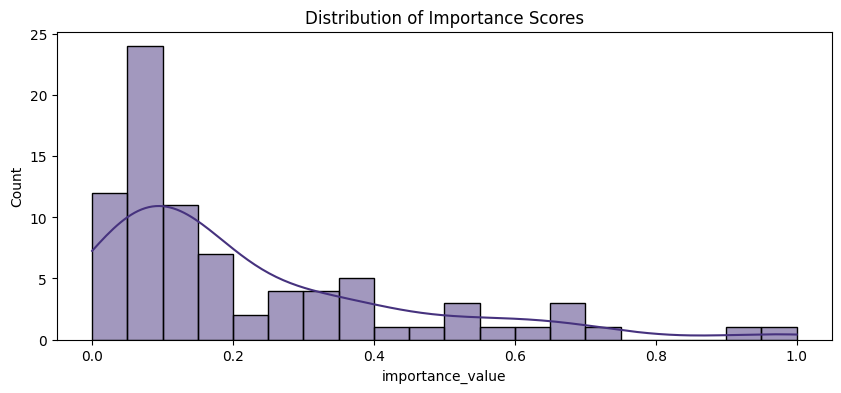

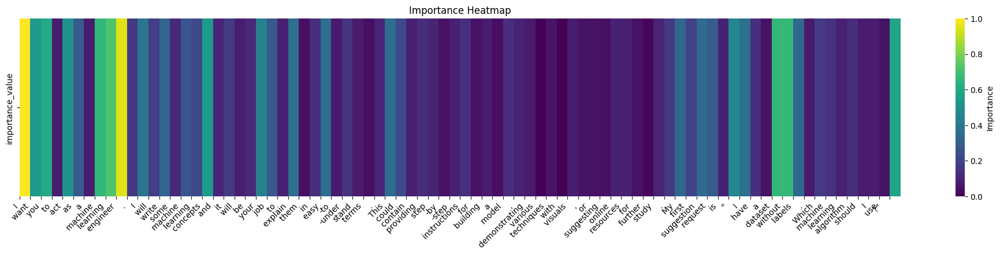

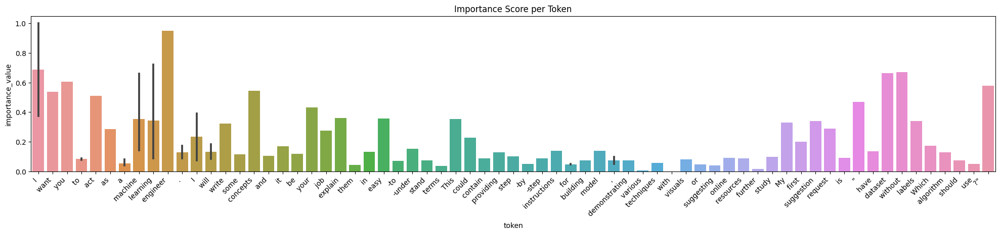

Top 10 Most Important Words:
        token  importance_value
0           I          1.000000
9    engineer          0.949530
8    learning          0.719967
71    without          0.668570
70    dataset          0.662413
7     machine          0.658165
2         you          0.604441
81       ?"\n          0.578495
17   concepts          0.544822
1        want          0.537255

Top 10 Least Important Words:
          token  importance_value
50         with          0.000000
48      various          0.006864
58      further          0.016737
32        terms          0.035301
44            a          0.038015
54   suggesting          0.039972
26         them          0.041956
53           or          0.044778
57          for          0.044880
69            a          0.046968

Correlation between importance and position in text: -0.30
P-value: 0.01


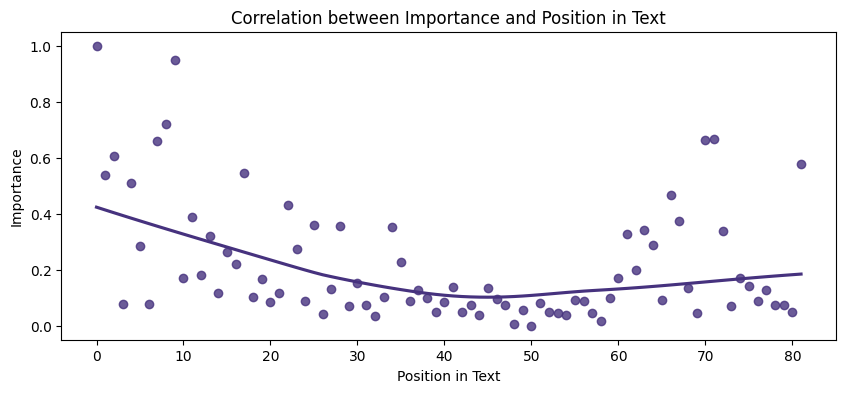




-----GPT-3 Embedded Log Scaled vs. Integrated Gradients-----


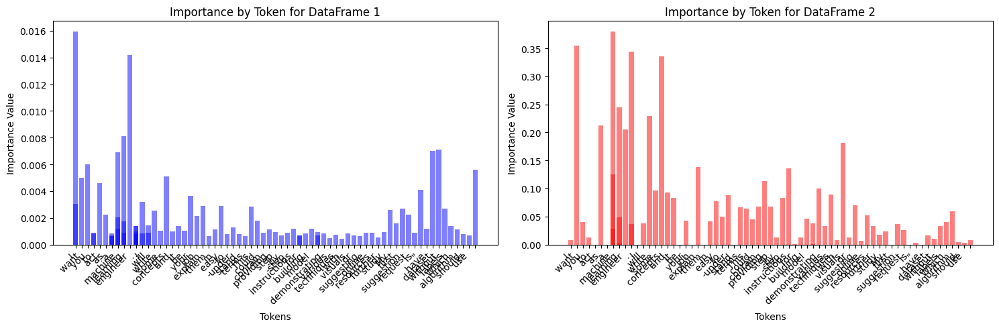

{'Pearson Correlation': 0.2953872241487025, 'Cosine Similarity': 0.5501591292548027, 'Euclidean Distance': 0.10410458681326452, "Kendall's Tau": 0.18736260218688422}


In [303]:
# Prompt 5 Analysis
a2b, b2a = tokenizations.get_alignments(gpt3_importance_map_df5['token'].values.tolist(), attribution_df5['token'].values.tolist())
aligned_dfa5, aligned_dfb5 = align_dataframes(b2a, gpt3_importance_map_df5, a2b, attribution_df5)

print("-----Integrated Gradients Attributions-----")
analyze_heatmap(attribution_df5)
print("-----GPT-3 Embedded Ablated Log Scaled-----")
analyze_heatmap(gpt3_importance_map_log_df5)

print("\n\n")

print("-----GPT-3 Embedded Log Scaled vs. Integrated Gradients-----")
print(compare_heatmaps(aligned_dfa5, aligned_dfb5))